In [1]:
#Import Modules
import pyart
import numpy as np
import matplotlib.pyplot as plt
import scipy
%matplotlib inline
from io import StringIO
from boto.s3.connection import S3Connection
import shutil, os, sys
import gzip
import pylab as plb
import matplotlib as mpl
import numpy.ma as ma
from pylab import *
print(pyart.__version__)

1.6.0


/home/zsherman/anaconda3/lib/python3.5/site-packages/pyart/map/grid_mapper.py:40: DeprecationWarning: inspect.getargspec() is deprecated, use inspect.signature() instead
  from .ball_tree import BallTree
/home/zsherman/anaconda3/lib/python3.5/site-packages/ipykernel/pylab/config.py:66: DeprecationWarning: metadata {'config': True} was set from the constructor.  Metadata should be set using the .tag() method, e.g., Int().tag(key1='value1', key2='value2')
  inline backend."""
/home/zsherman/anaconda3/lib/python3.5/site-packages/ipykernel/pylab/config.py:71: DeprecationWarning: metadata {'config': True} was set from the constructor.  Metadata should be set using the .tag() method, e.g., Int().tag(key1='value1', key2='value2')
  'retina', 'jpeg', 'svg', 'pdf'.""")
/home/zsherman/anaconda3/lib/python3.5/site-packages/ipykernel/pylab/config.py:85: DeprecationWarning: metadata {'config': True} was set from the constructor.  Metadata should be set using the .tag() method, e.g., Int().tag(key1=

In [2]:
#gzip and opening CPOL files
LOCAL_PATH = '/home/zsherman/Documents/Jupyter/'
filenames = []
conn = S3Connection(anon=True)
bucket = conn.get_bucket('testradar', validate=False)
bucket_list = bucket.list()
for l in bucket_list:
    keyString = str(l.key)
    print(keyString)
    if '.gz' in keyString:
        l.get_contents_to_filename(LOCAL_PATH+keyString)
        filenames.append(LOCAL_PATH+keyString[0:-3])
        gzfh = gzip.open(LOCAL_PATH+keyString, 'rb')
        ofh = open(LOCAL_PATH+keyString[0:-3], 'wb')
        for line in gzfh:
            ofh.write(line)
        ofh.close()
        gzfh.close()
        os.remove(LOCAL_PATH+keyString)

CSU_unfolded/
CSU_unfolded/CPOL_corr_20060122_082009_vt_unfolded_hand.cfrad.nc.gz
CSU_unfolded/CPOL_corr_20060122_083009_vt_unfolded_hand.cfrad.nc.gz
CSU_unfolded/CPOL_corr_20060122_084009_vt_unfolded_hand.cfrad.nc.gz
CSU_unfolded/CPOL_corr_20060122_085009_vt_unfolded_hand.cfrad.nc.gz
CSU_unfolded/CPOL_corr_20060122_090008_vt_unfolded_hand.cfrad.nc.gz
CSU_unfolded/CPOL_corr_20060122_091008_vt_unfolded_hand.cfrad.nc.gz
CSU_unfolded/CPOL_corr_20060122_092008_vt_unfolded_hand.cfrad.nc.gz
CSU_unfolded/CPOL_corr_20060122_093013_vt_unfolded_hand.cfrad.nc.gz
CSU_unfolded/CPOL_corr_20060122_094009_vt_unfolded_hand.cfrad.nc.gz
CSU_unfolded/CPOL_corr_20060122_095009_vt_unfolded_hand.cfrad.nc.gz
CSU_unfolded/CPOL_corr_20060122_100009_vt_unfolded_hand.cfrad.nc.gz
CSU_unfolded/CPOL_corr_20060122_101009_vt_unfolded_hand.cfrad.nc.gz
CSU_unfolded/CPOL_corr_20060122_102008_vt_unfolded_hand.cfrad.nc.gz
CSU_unfolded/CPOL_corr_20060122_103009_vt_unfolded_hand.cfrad.nc.gz
CSU_unfolded/CPOL_corr_20060122_10

In [3]:
#Defining and running all files through the pyart dealias algorithm
def corrected_velocity_added(radar):
    corrV_added = pyart.correct.dealias_region_based(radar, interval_splits=10, rays_wrap_around=True, keep_original=False)
    radar.add_field('corrected_velocity_added', corrV_added, replace_existing = True)

In [4]:
#Defining and displaying reflectivity field for all files.
def reflectivity_fields(radar):
    dZ = radar.fields['reflectivity']['data']
    dZ_mean = ma.mean(dZ)
    dZ_std = ma.std(dZ)
    dZ_max = ma.max(dZ)
    indxs = ma.where(dZ == ma.max(dZ))

    print('Statistics of reflectivity field: %.0f' % (dZ_mean) + " +/- " + '%.0f' % (dZ_std))

In [5]:
#Displaying Velocity from all files.
def velocity_data(radar):
    velocity = [ma.asanyarray(radar.fields['velocity']['data'])]
    print("Velocity")
    return velocity

In [6]:
def corrected_velocity_data(radar):
    cv_attribute_name = ''
    if ('corrected_velocity' in radar_file.fields):
        cv_attribute_name = 'corrected_velocity'
    elif ('corrected_velocity2' in radar_file.fields):
        cv_attribute_name = 'corrected_velocity2'
    else:
        raise Exception('key not found')
    corrected_velocity = ma.asanyarray(radar.fields[cv_attribute_name]['data'])
    print("Corrected Velocity")
    return corrected_velocity

In [7]:
#Finding the dealiased difference from the changes done by pyart.
def dealiasing_differences_func_region(radar, ny_vel):
    diff_reg = radar.fields['corrected_velocity_added']['data'] - radar.fields['velocity']['data']
    diff_reg_sc = diff_reg/ny_vel
    diff_region = radar.fields['corrected_velocity_added']
    diff_region['data'] = diff_reg_sc
    diff_region['long_name'] = 'Region Dealiased Added Nyquist intervals'
    diff_region['standard_name'] = "added_Ny_intervals"
    diff_region['units']=''
    radar.add_field('dealiasing_differences_sc_region', diff_region, replace_existing = True)

In [8]:
#Finding the dealiased difference from the changes done by hand.
#There are two functions because radar_files[2] has a different name for corrected_velocity.
#Instead corrected_velocity2
def dealiasing_differences_func_hand(radar, ny_vel):
    cv_attribute_name = ''
    if ('corrected_velocity' in radar_file.fields):
        cv_attribute_name = 'corrected_velocity'
    elif ('corrected_velocity2' in radar_file.fields):
        cv_attribute_name = 'corrected_velocity2'
    else:
        raise Exception('key not found')
    diff_reg = radar.fields[cv_attribute_name]['data'] - radar.fields['velocity']['data']
    diff_reg_sc = diff_reg/ny_vel
    diff_hand = radar.fields[cv_attribute_name]
    diff_hand['data'] = diff_reg_sc
    diff_hand['long_name'] = 'Hand Dealiased Added Nyquist intervals'
    diff_hand['standard_name'] = "added_Ny_intervals"
    diff_hand['units']=''
    radar.add_field('dealiasing_differences_sc_hand', diff_hand, replace_existing = True)

In [9]:
#Number of hand-dealiased gates that occured.
def n_gates_hand(radar):
    dealias_hands = []
    dealias_hand = ma.asanyarray(radar.fields['dealiasing_differences_sc_hand']['data'][radar_file.get_slice(3)])
    dealias_hands += [dealias_hand]
    n_gates_hand = np.count_nonzero(dealias_hand != 0)
    print("Number of Gates Hand Dealiased")
    return n_gates_hand

In [10]:
#Number of region-dealiased gates that occur.
def n_gates_region(radar):
    dealias_regions = []
    dealias_region = ma.asanyarray(radar.fields['dealiasing_differences_sc_region']['data'][radar_file.get_slice(3)])
    dealias_regions += [dealias_region]
    n_gates_region = np.count_nonzero(dealias_region != 0)
    print("Number of Gates Region Dealiased")
    return n_gates_region

In [ ]:
def time(radar):
    time = np.array(radar.time)

In [ ]:
radar_files = []
for filename in filenames:
    radar_file = pyart.io.read(filename)
    radar_files += [radar_file]  
    ny_vel = radar_file.instrument_parameters['nyquist_velocity']['data'][0]
    corrected_velocity_added(radar_file)
  
    dealiasing_differences_func_region(radar_file, ny_vel)
    #Putting each radar_file through the dealiasing difference function.
    dealiasing_differences_func_hand(radar_file, ny_vel)
    print(filename)
    print(n_gates_hand(radar_file))
    print(n_gates_region(radar_file))

/home/zsherman/Documents/Jupyter/CSU_unfolded/CPOL_corr_20060122_082009_vt_unfolded_hand.cfrad.nc
Number of Gates Hand Dealiased
0
Number of Gates Region Dealiased
8
/home/zsherman/Documents/Jupyter/CSU_unfolded/CPOL_corr_20060122_083009_vt_unfolded_hand.cfrad.nc
Number of Gates Hand Dealiased
0
Number of Gates Region Dealiased
45
/home/zsherman/Documents/Jupyter/CSU_unfolded/CPOL_corr_20060122_084009_vt_unfolded_hand.cfrad.nc
Number of Gates Hand Dealiased
30
Number of Gates Region Dealiased
34
/home/zsherman/Documents/Jupyter/CSU_unfolded/CPOL_corr_20060122_085009_vt_unfolded_hand.cfrad.nc
Number of Gates Hand Dealiased
0
Number of Gates Region Dealiased
9
/home/zsherman/Documents/Jupyter/CSU_unfolded/CPOL_corr_20060122_090008_vt_unfolded_hand.cfrad.nc
Number of Gates Hand Dealiased
0
Number of Gates Region Dealiased
100
/home/zsherman/Documents/Jupyter/CSU_unfolded/CPOL_corr_20060122_091008_vt_unfolded_hand.cfrad.nc
Number of Gates Hand Dealiased
0
Number of Gates Region Dealiased
1

Number of Gates Hand Dealiased
0
Number of Gates Region Dealiased
8


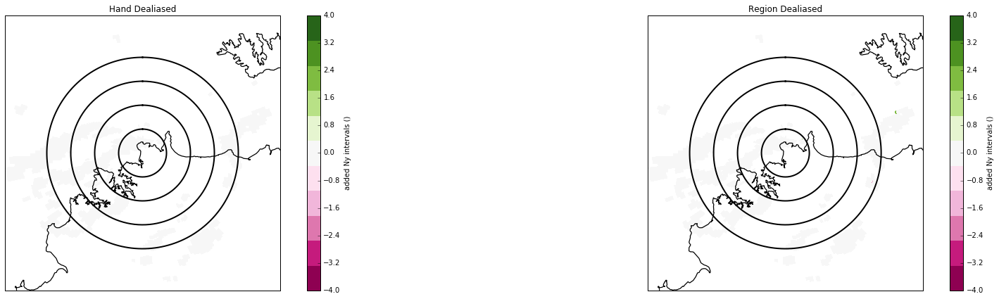

Number of Gates Hand Dealiased
0
Number of Gates Region Dealiased
45


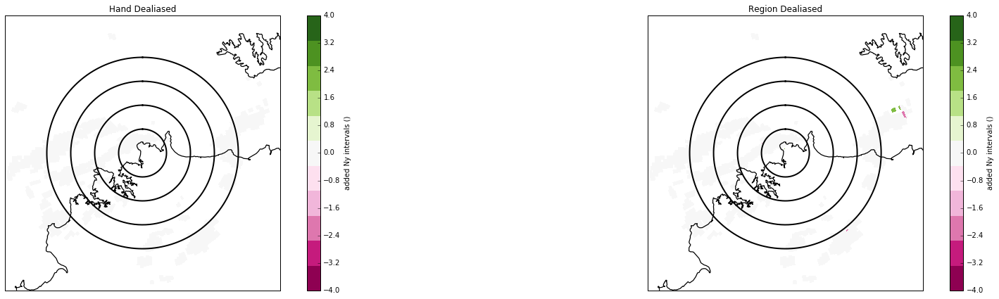

Number of Gates Hand Dealiased
30
Number of Gates Region Dealiased
34


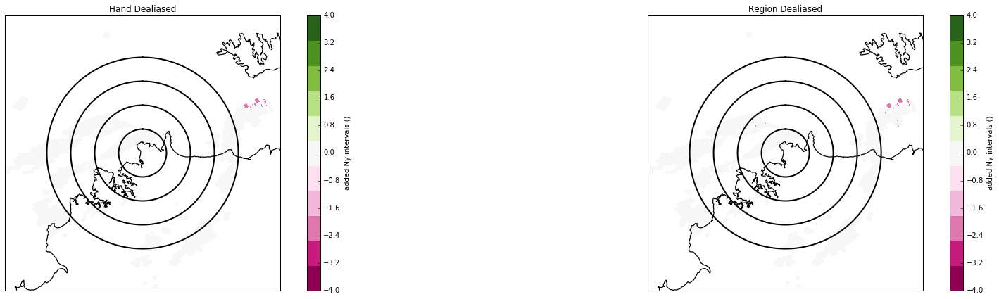

Number of Gates Hand Dealiased
0
Number of Gates Region Dealiased
9


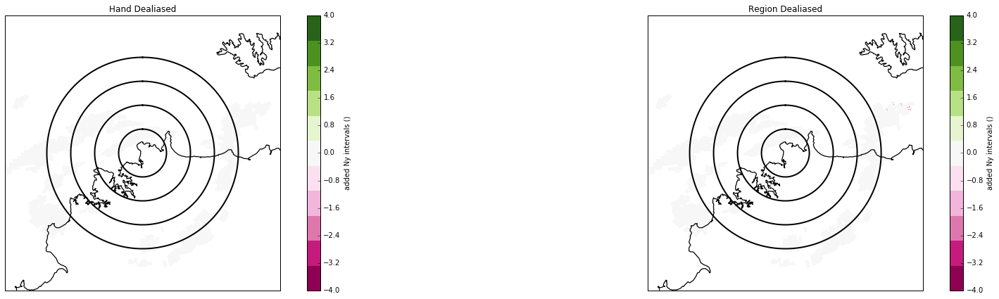

Number of Gates Hand Dealiased
0
Number of Gates Region Dealiased
100


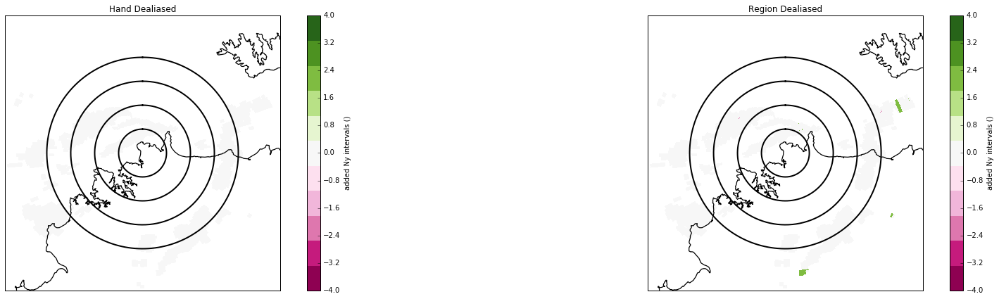

Number of Gates Hand Dealiased
0
Number of Gates Region Dealiased
19


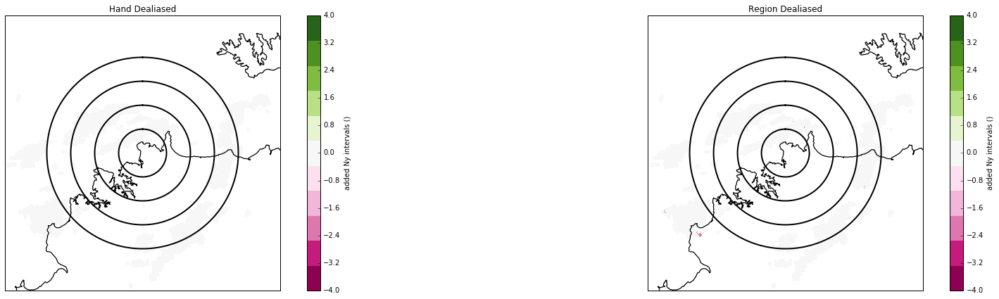

Number of Gates Hand Dealiased
0
Number of Gates Region Dealiased
9


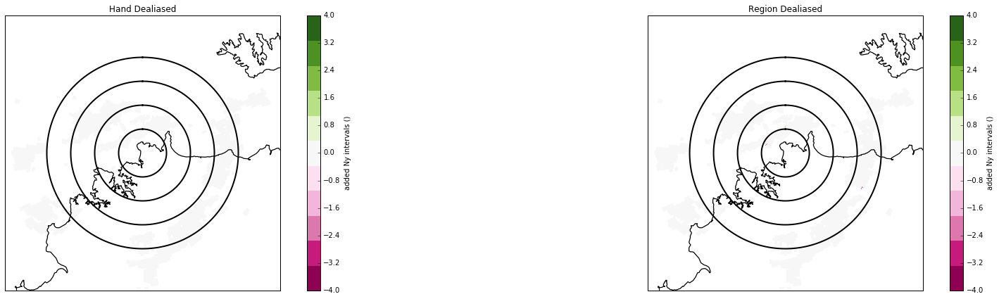

Number of Gates Hand Dealiased
0
Number of Gates Region Dealiased
323


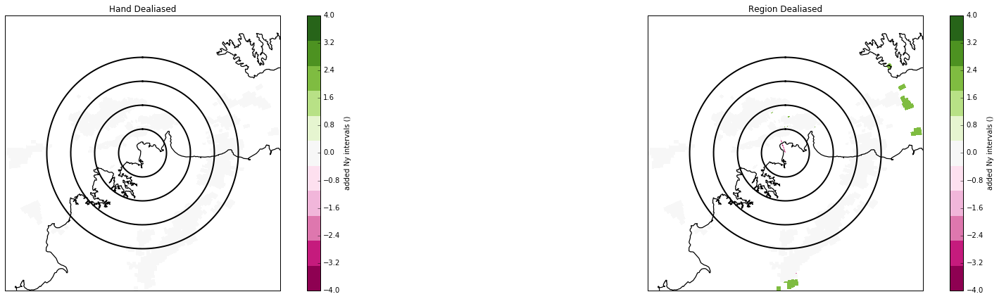

Number of Gates Hand Dealiased
0
Number of Gates Region Dealiased
60


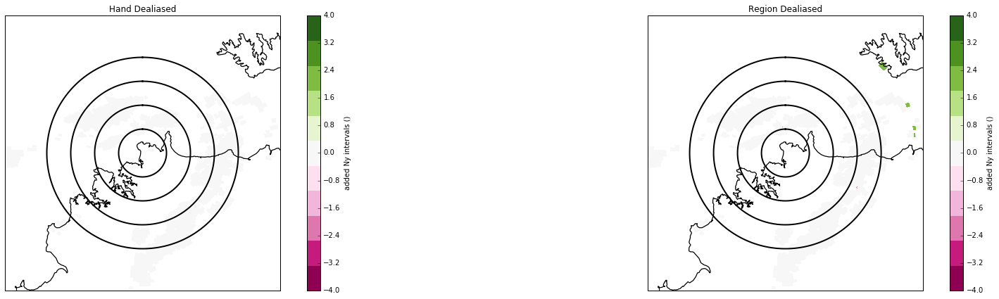

Number of Gates Hand Dealiased
0
Number of Gates Region Dealiased
24


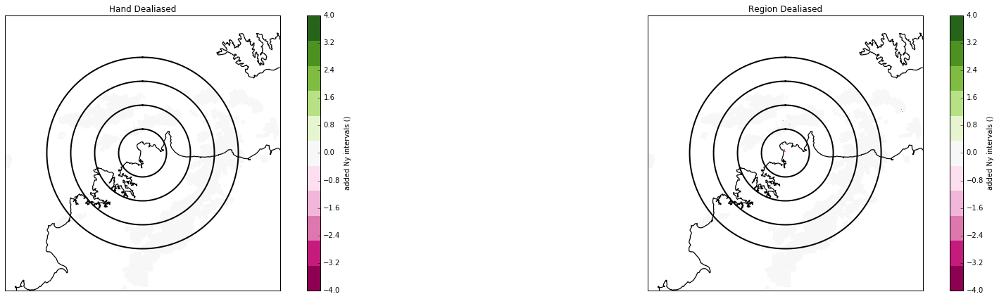

Number of Gates Hand Dealiased
0
Number of Gates Region Dealiased
2


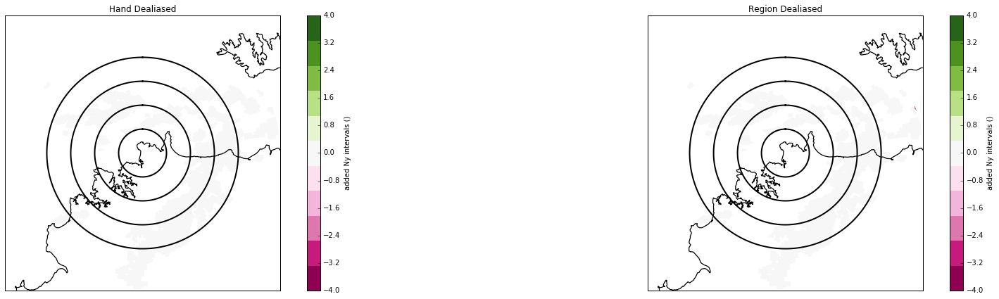

Number of Gates Hand Dealiased
0
Number of Gates Region Dealiased
4


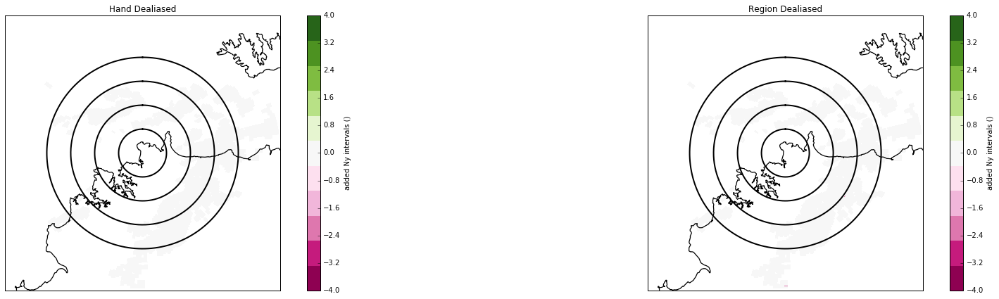

Number of Gates Hand Dealiased
0
Number of Gates Region Dealiased
2


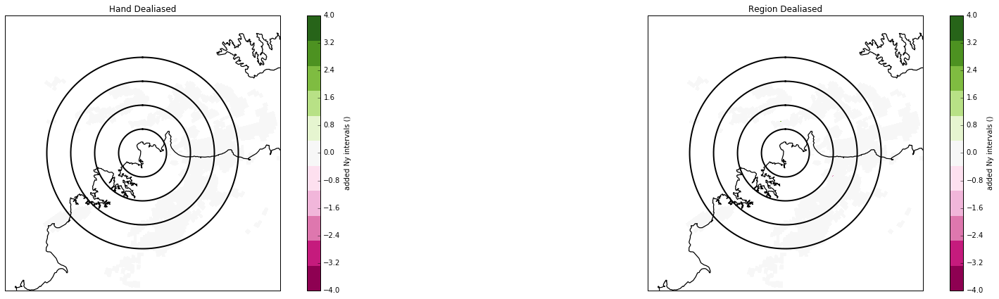

Number of Gates Hand Dealiased
0
Number of Gates Region Dealiased
7


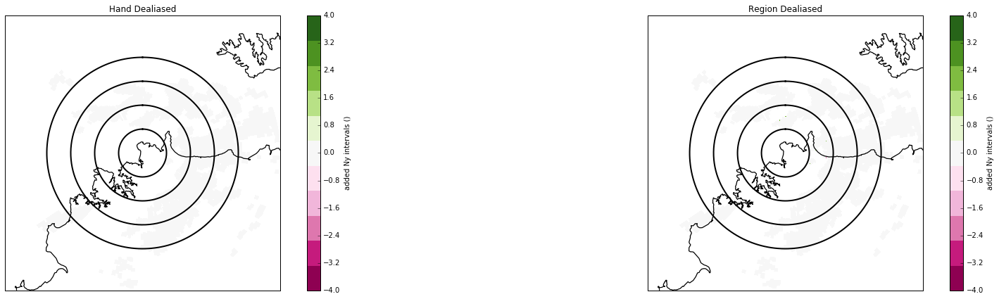

Number of Gates Hand Dealiased
0
Number of Gates Region Dealiased
4


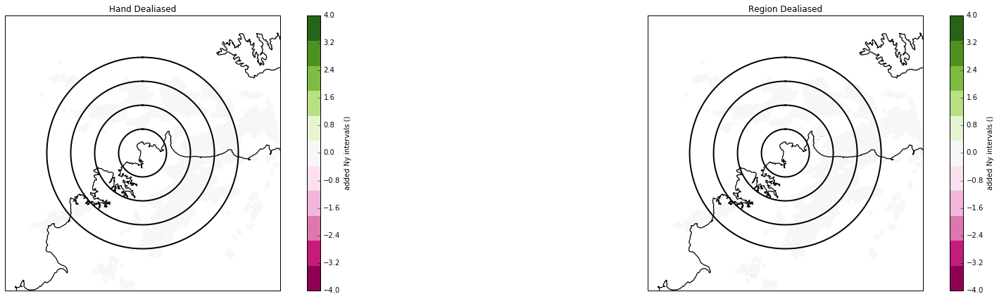

Number of Gates Hand Dealiased
0
Number of Gates Region Dealiased
5


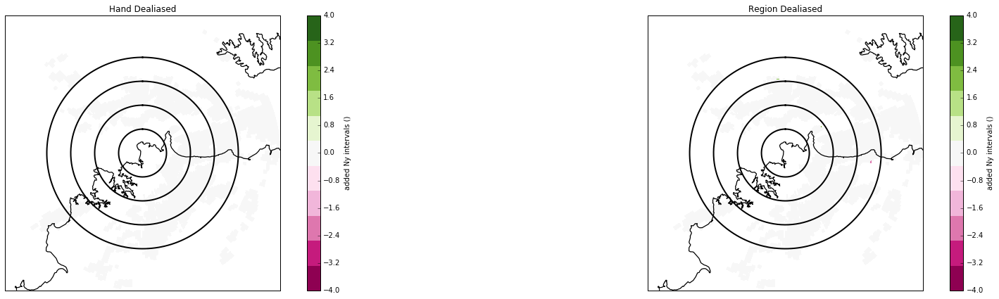

Number of Gates Hand Dealiased
0
Number of Gates Region Dealiased
6


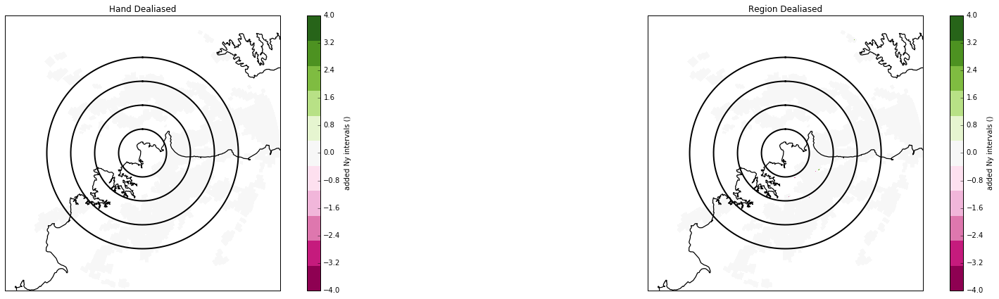

Number of Gates Hand Dealiased
0
Number of Gates Region Dealiased
6


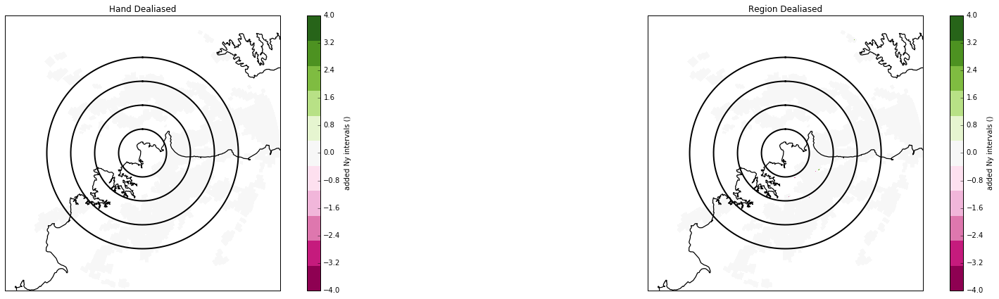

Number of Gates Hand Dealiased
0
Number of Gates Region Dealiased
18


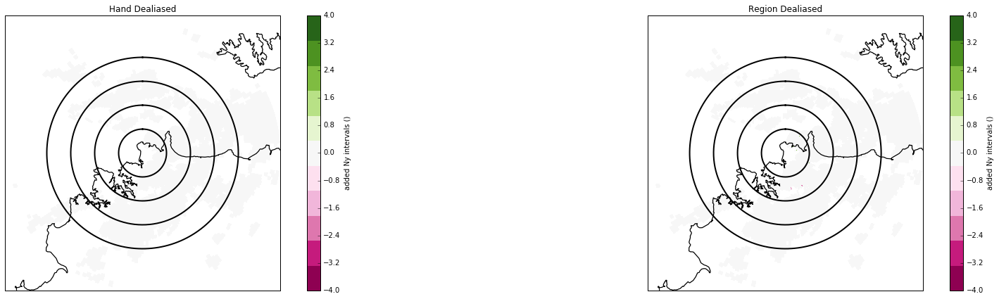

Number of Gates Hand Dealiased
0
Number of Gates Region Dealiased
29


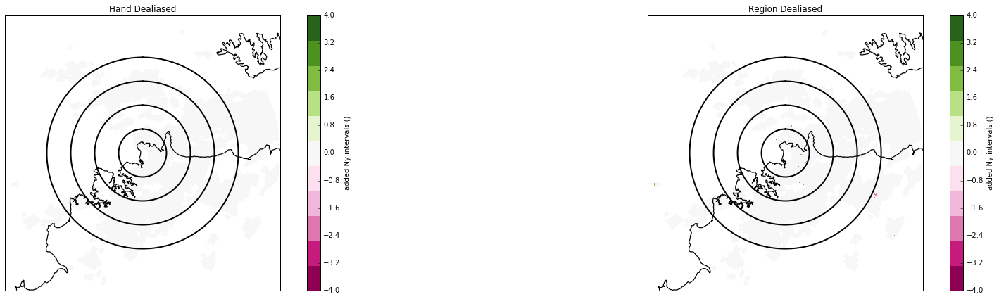

Number of Gates Hand Dealiased
0
Number of Gates Region Dealiased
52


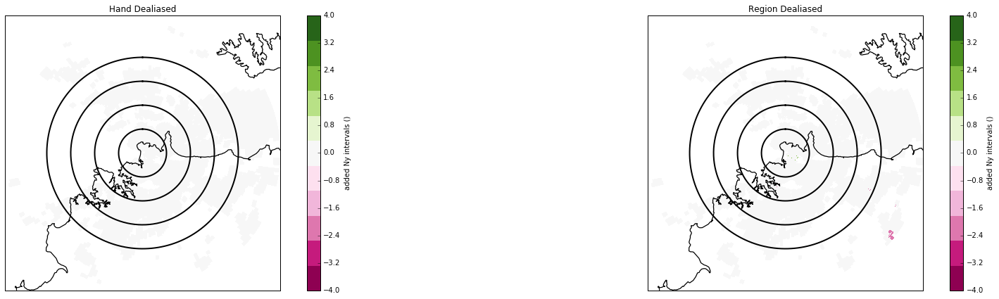

Number of Gates Hand Dealiased
0
Number of Gates Region Dealiased
137


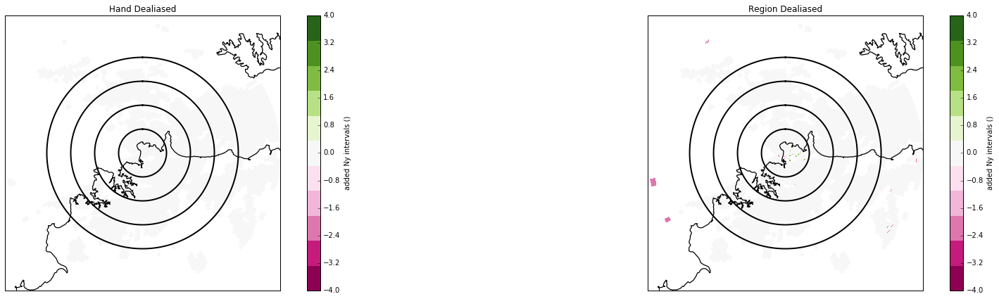

Number of Gates Hand Dealiased
115
Number of Gates Region Dealiased
137


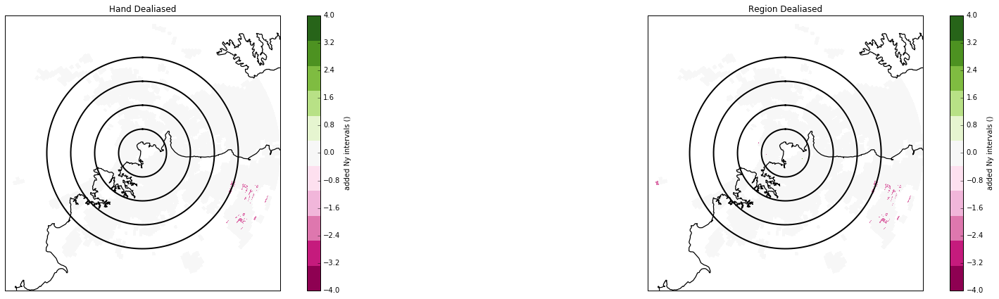

Number of Gates Hand Dealiased
560
Number of Gates Region Dealiased
555


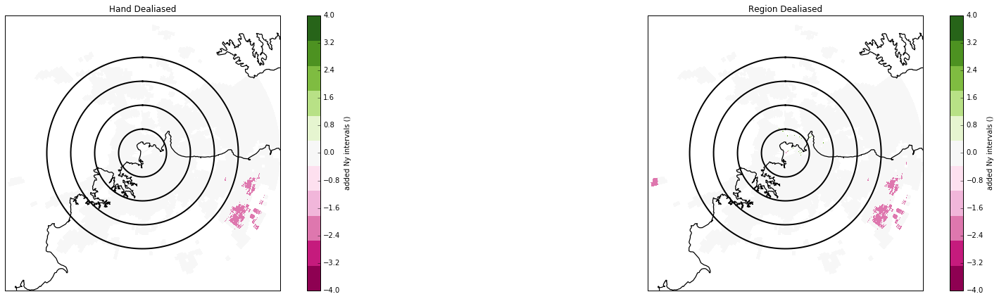

Number of Gates Hand Dealiased
1051
Number of Gates Region Dealiased
1081


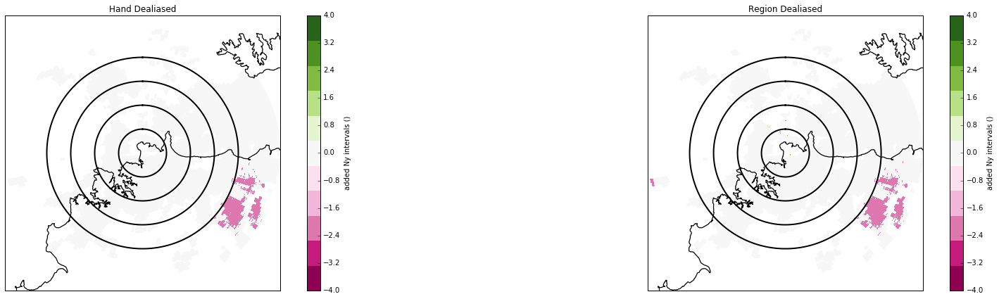

Number of Gates Hand Dealiased
1664
Number of Gates Region Dealiased
1774


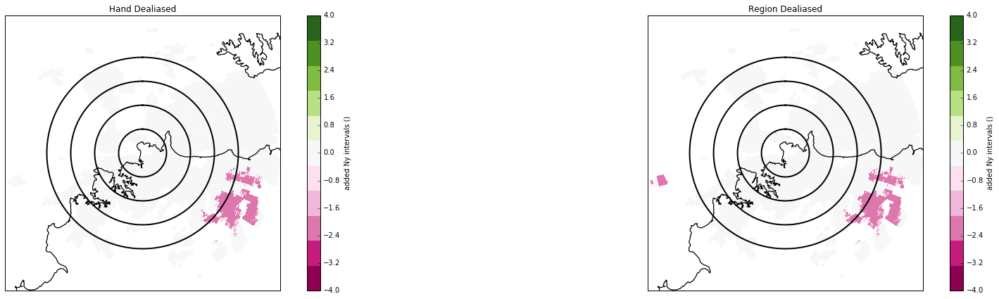

Number of Gates Hand Dealiased
2112
Number of Gates Region Dealiased
2430


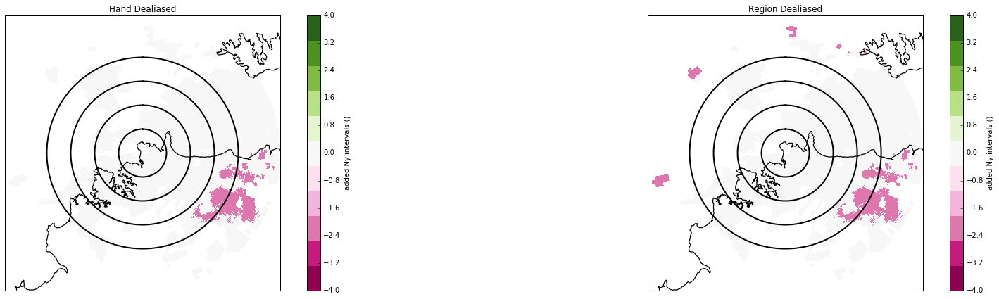

Number of Gates Hand Dealiased
2286
Number of Gates Region Dealiased
2318


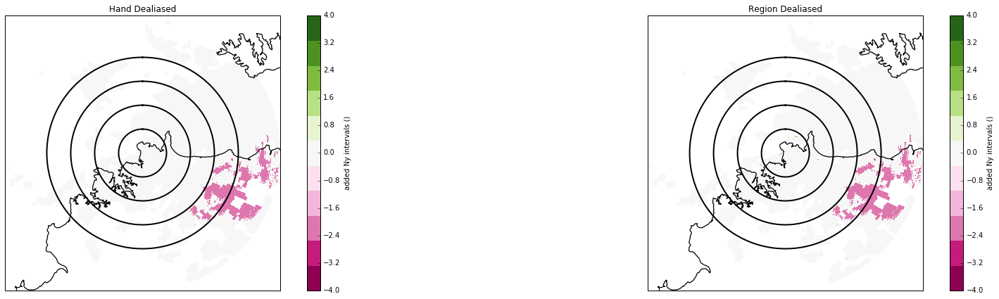

Number of Gates Hand Dealiased
2507
Number of Gates Region Dealiased
2615


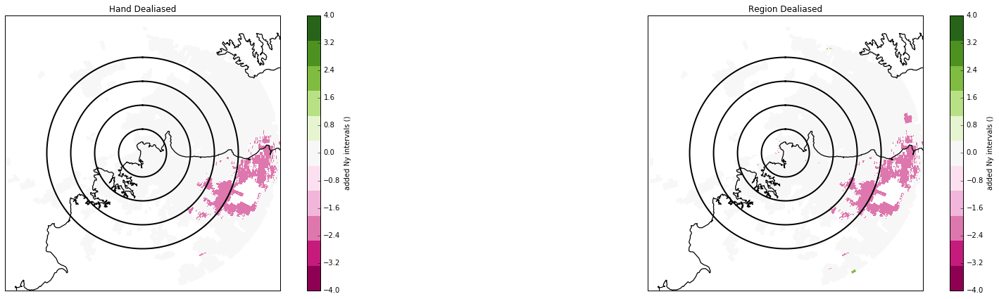

Number of Gates Hand Dealiased
2841
Number of Gates Region Dealiased
2974


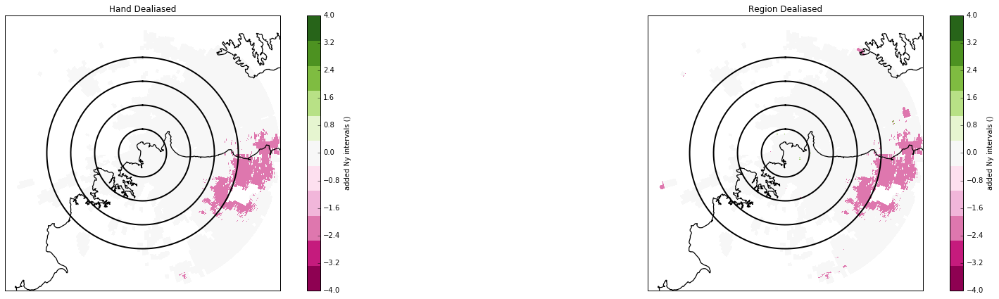

Number of Gates Hand Dealiased
3104
Number of Gates Region Dealiased
3160


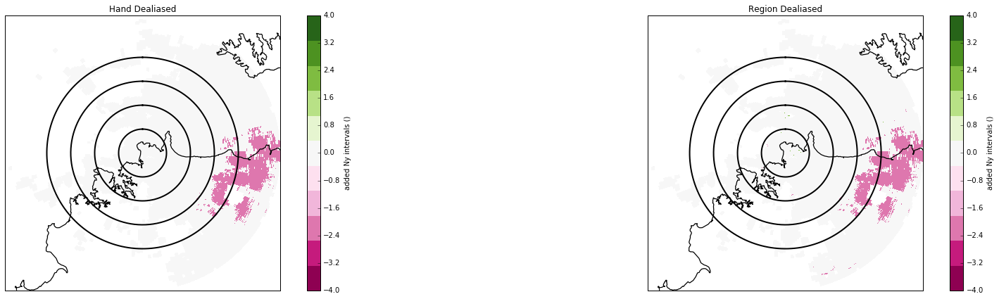

Number of Gates Hand Dealiased
3023
Number of Gates Region Dealiased
3053


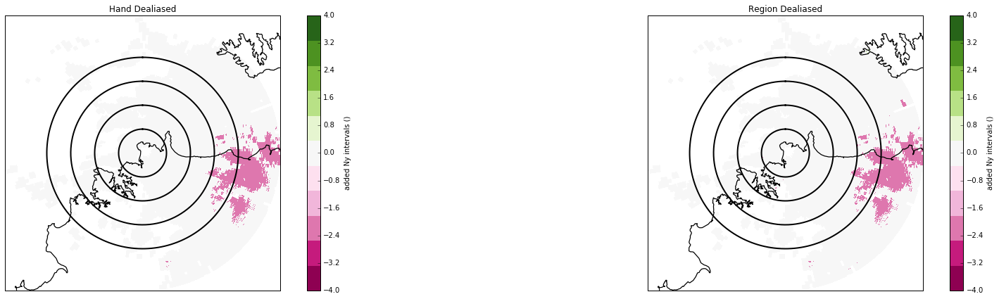

Number of Gates Hand Dealiased
2518
Number of Gates Region Dealiased
2699


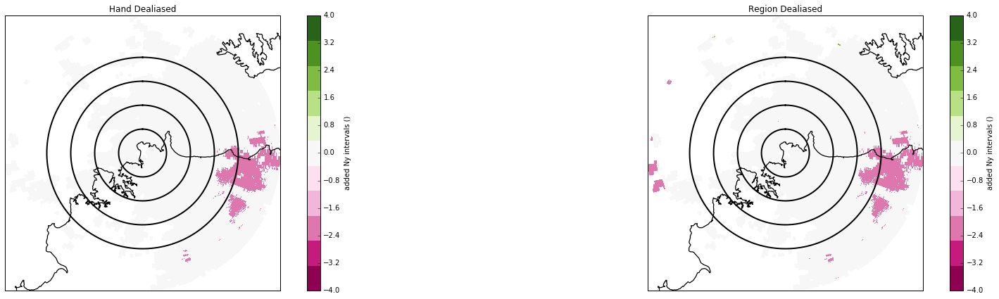

Number of Gates Hand Dealiased
2109
Number of Gates Region Dealiased
2136


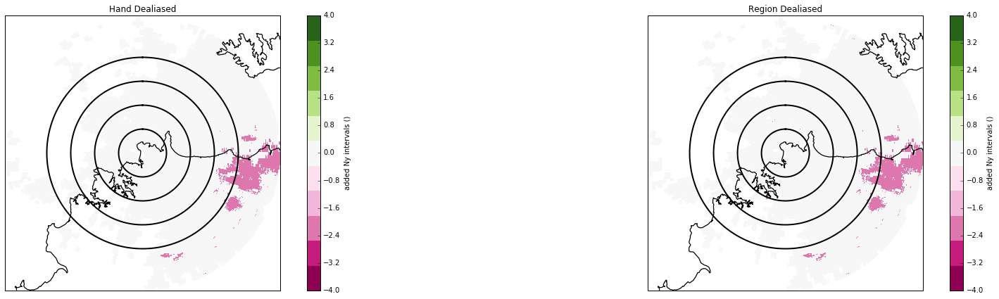

Number of Gates Hand Dealiased
1926
Number of Gates Region Dealiased
1929


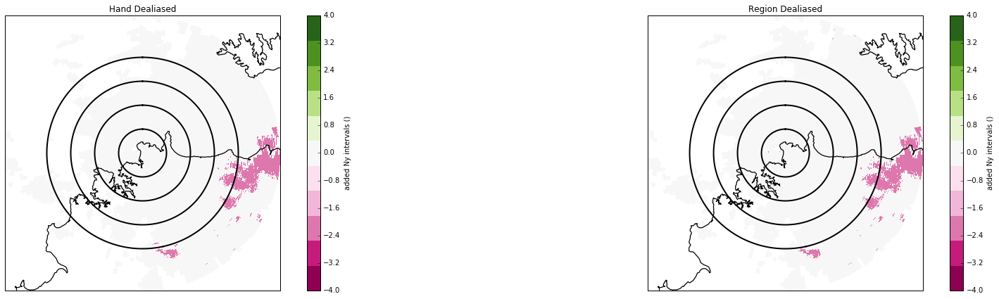

Number of Gates Hand Dealiased
1771
Number of Gates Region Dealiased
1782


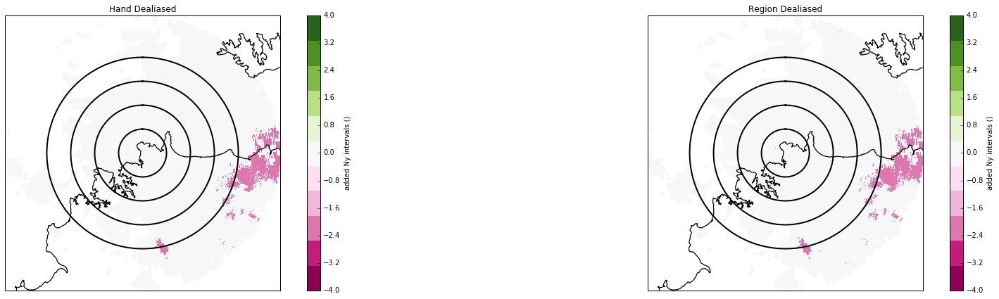

Number of Gates Hand Dealiased
40350
Number of Gates Region Dealiased
2102


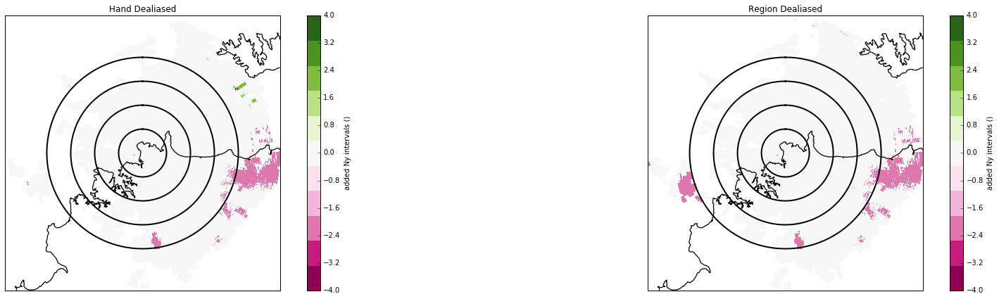

Number of Gates Hand Dealiased
1789
Number of Gates Region Dealiased
1846


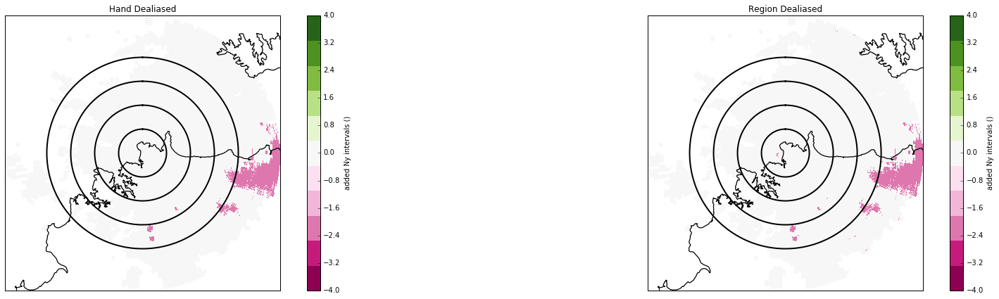

Number of Gates Hand Dealiased
2103
Number of Gates Region Dealiased
2123


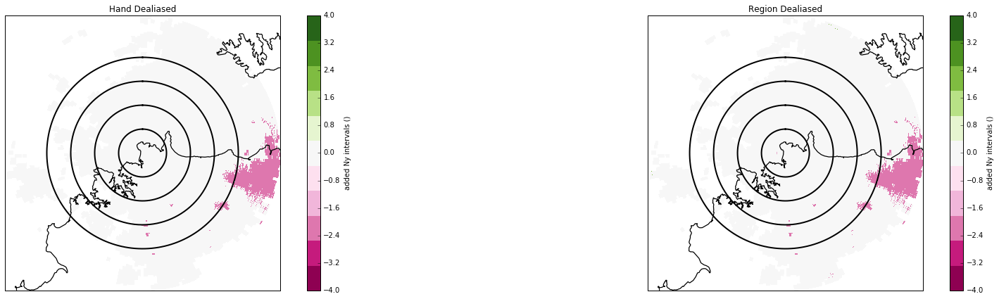

Number of Gates Hand Dealiased
1943
Number of Gates Region Dealiased
1976


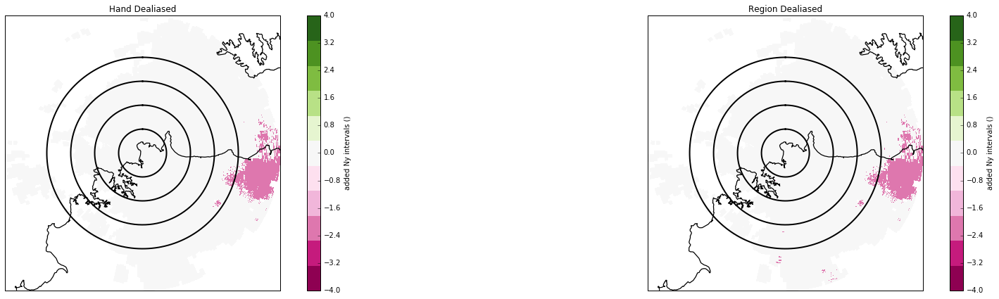

Number of Gates Hand Dealiased
1808
Number of Gates Region Dealiased
1798


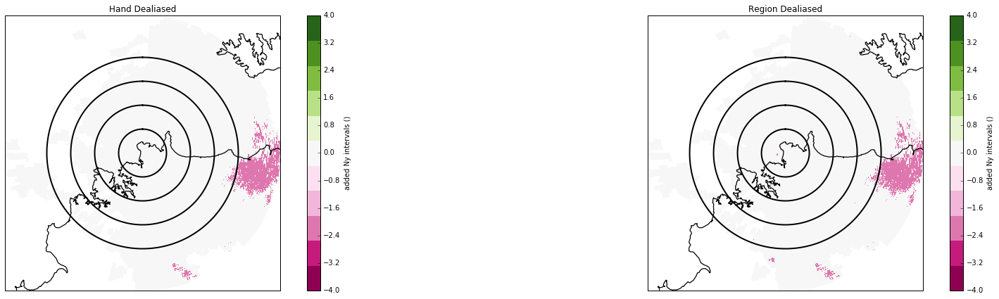

Number of Gates Hand Dealiased
1147
Number of Gates Region Dealiased
1160


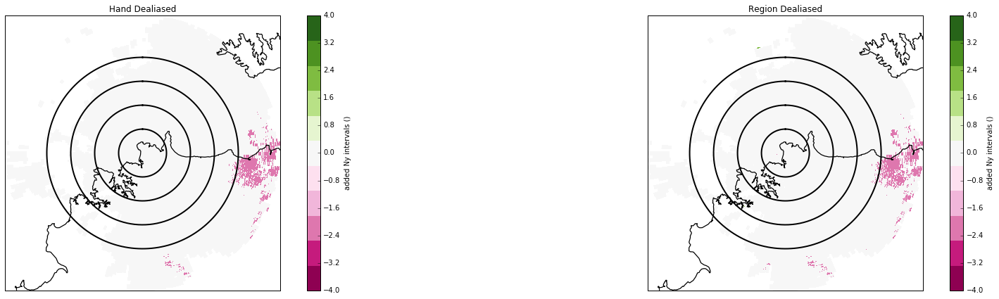

Number of Gates Hand Dealiased
657
Number of Gates Region Dealiased
672


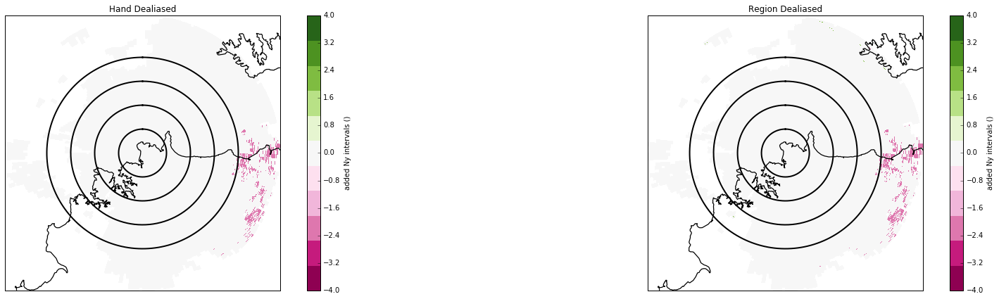

Number of Gates Hand Dealiased
506
Number of Gates Region Dealiased
518


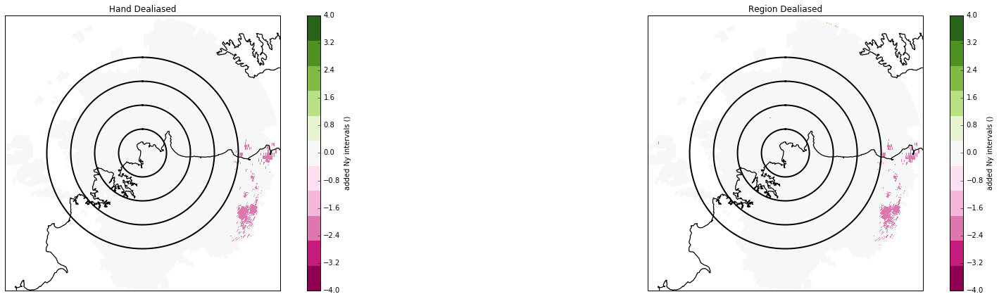

Number of Gates Hand Dealiased
529
Number of Gates Region Dealiased
641


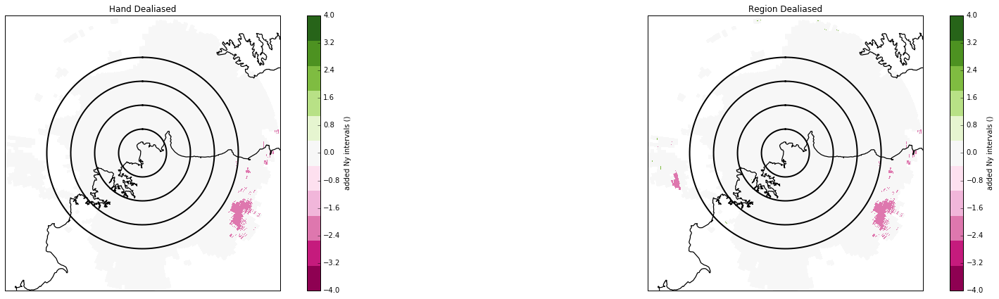

Number of Gates Hand Dealiased
657
Number of Gates Region Dealiased
794


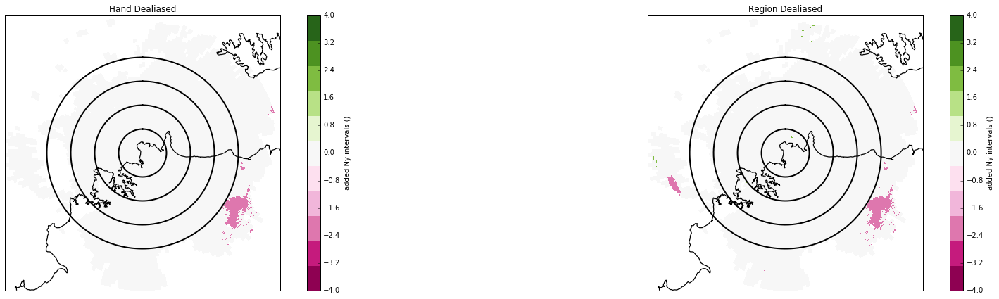

Number of Gates Hand Dealiased
788
Number of Gates Region Dealiased
791


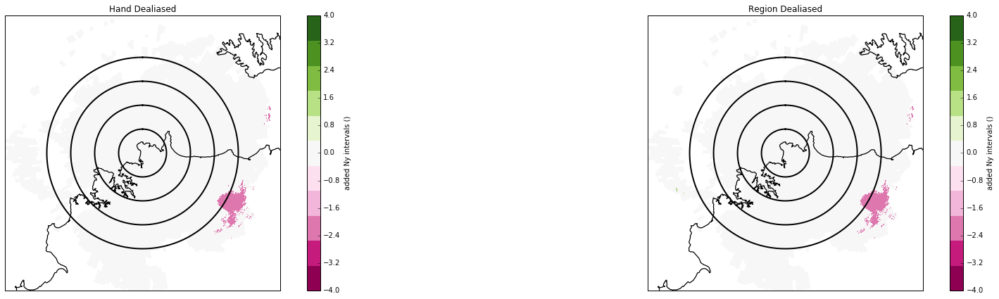

Number of Gates Hand Dealiased
1012
Number of Gates Region Dealiased
1019


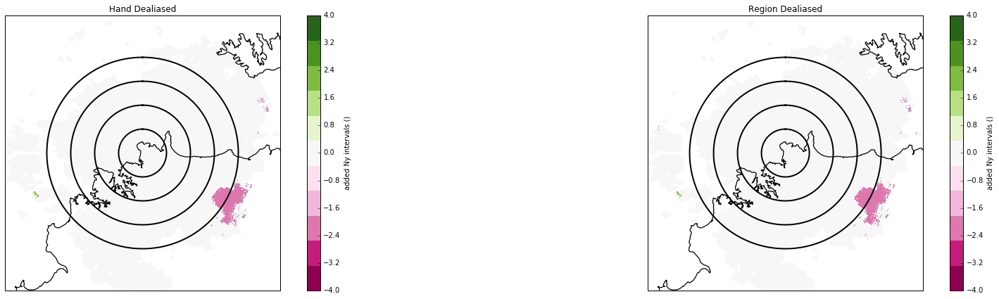

Number of Gates Hand Dealiased
1089
Number of Gates Region Dealiased
1102


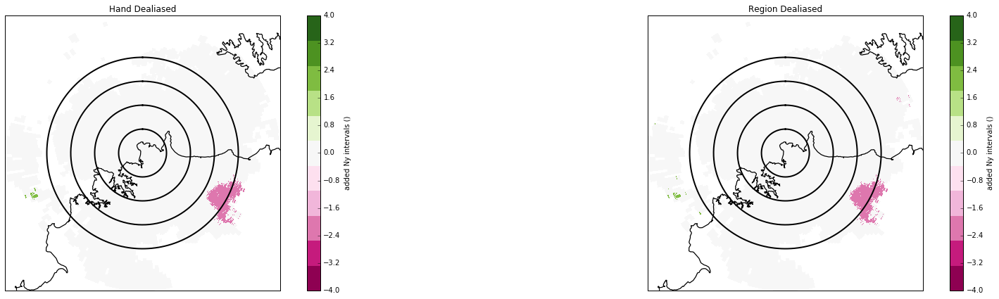

Number of Gates Hand Dealiased
751
Number of Gates Region Dealiased
799


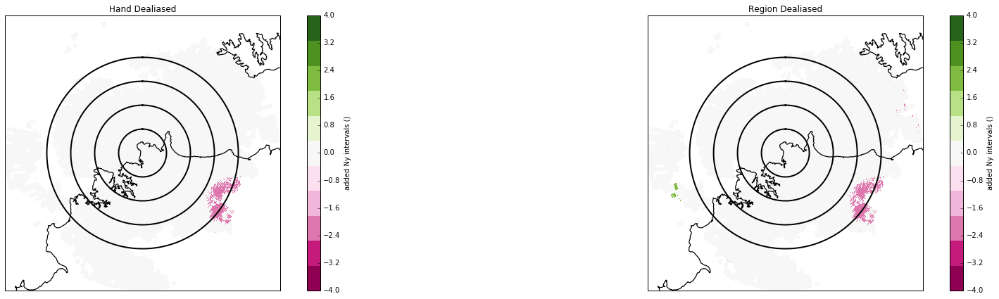

Number of Gates Hand Dealiased
322
Number of Gates Region Dealiased
371


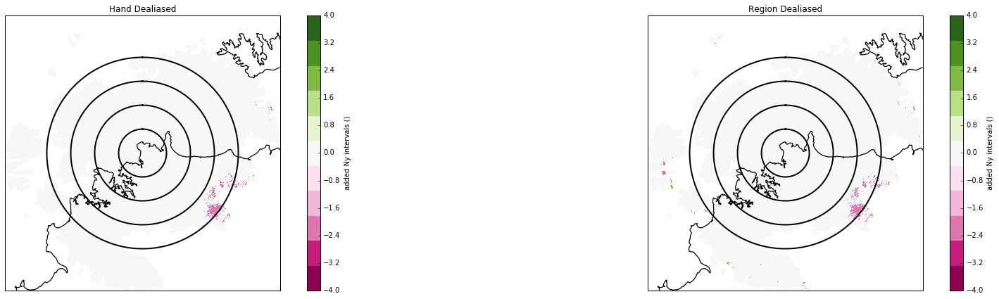

Number of Gates Hand Dealiased
73
Number of Gates Region Dealiased
161


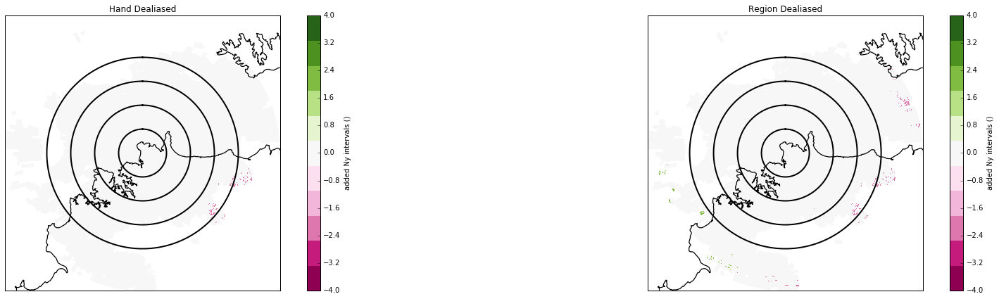

Number of Gates Hand Dealiased
29
Number of Gates Region Dealiased
184


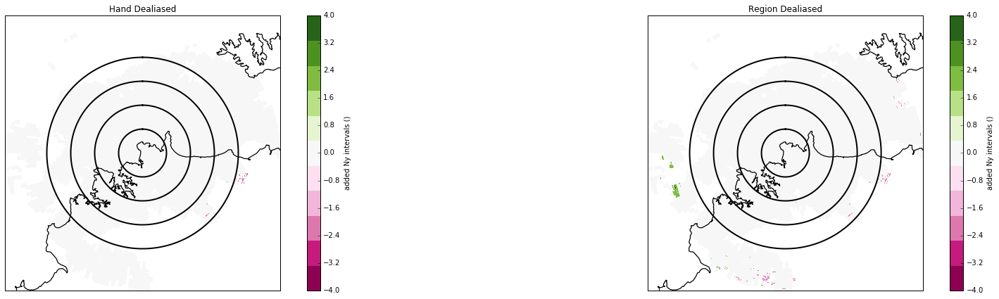

Number of Gates Hand Dealiased
67
Number of Gates Region Dealiased
169


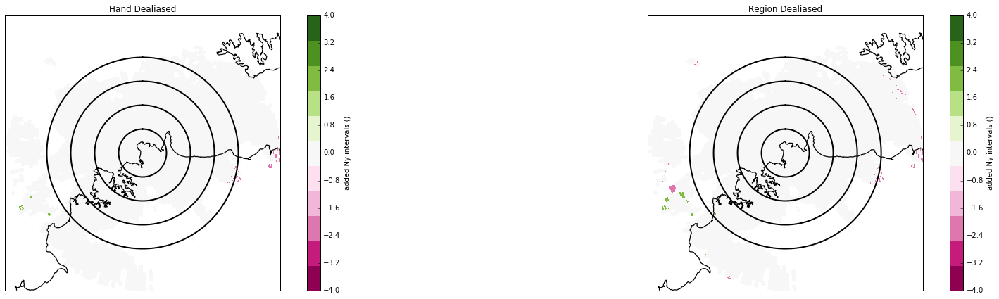

Number of Gates Hand Dealiased
141
Number of Gates Region Dealiased
217


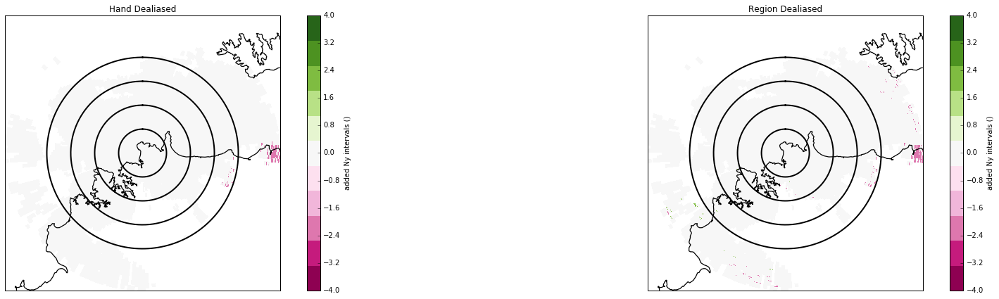

Number of Gates Hand Dealiased
338
Number of Gates Region Dealiased
519


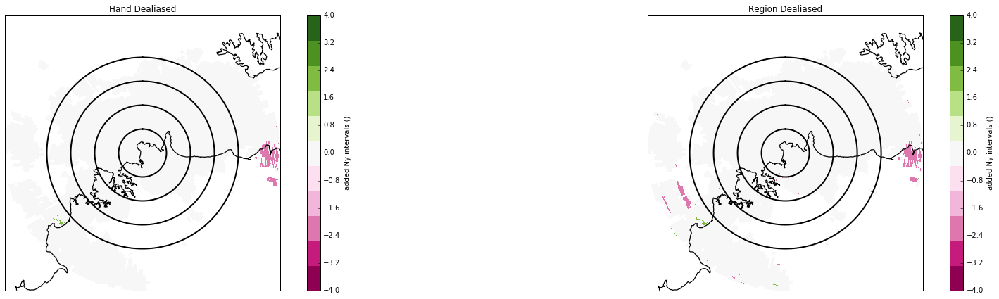

Number of Gates Hand Dealiased
514
Number of Gates Region Dealiased
562


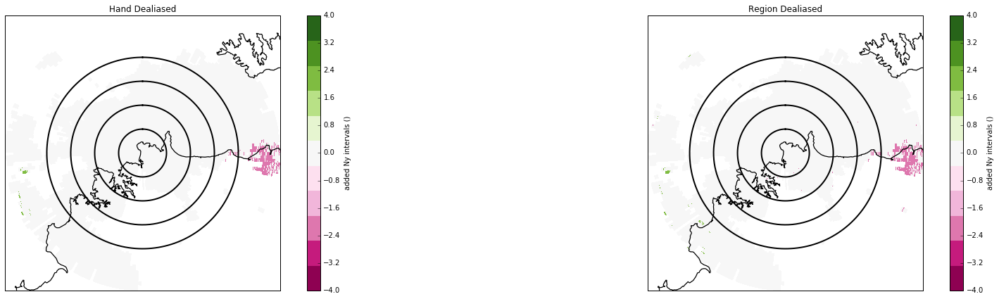

Number of Gates Hand Dealiased
974
Number of Gates Region Dealiased
1040


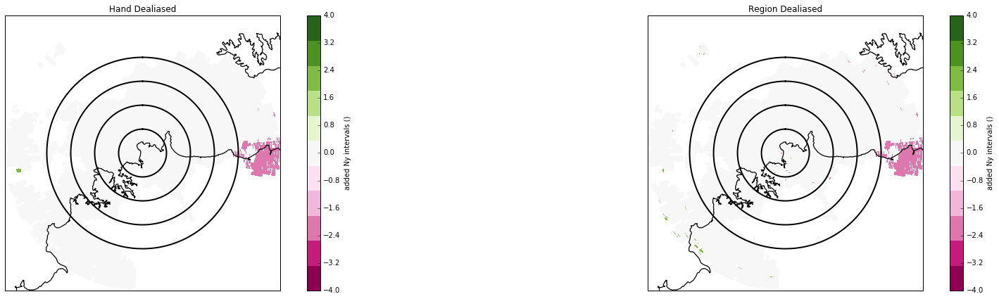

Number of Gates Hand Dealiased
1163
Number of Gates Region Dealiased
1211


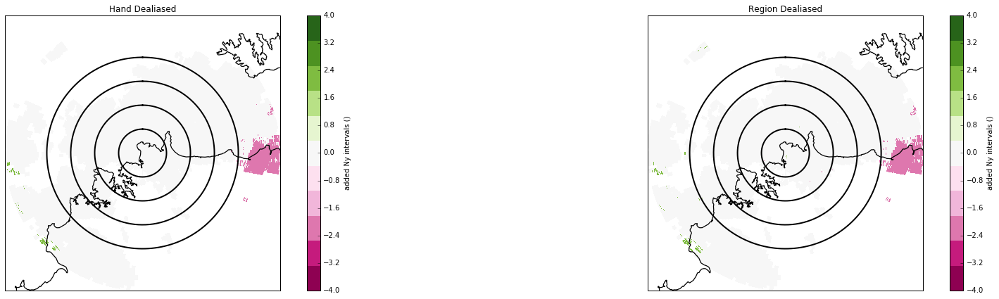

Number of Gates Hand Dealiased
1637
Number of Gates Region Dealiased
1723


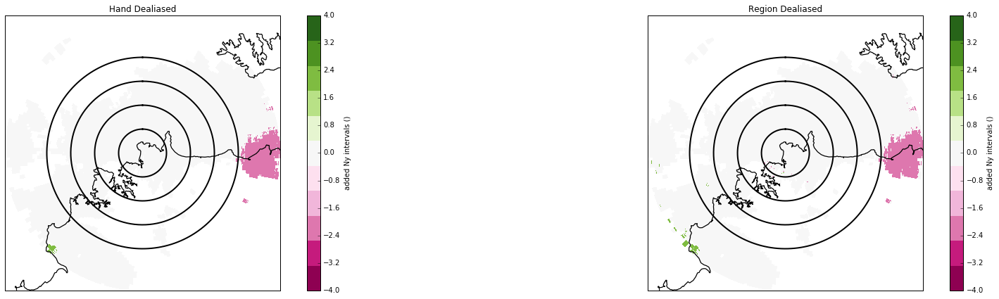

Number of Gates Hand Dealiased
1925
Number of Gates Region Dealiased
1973


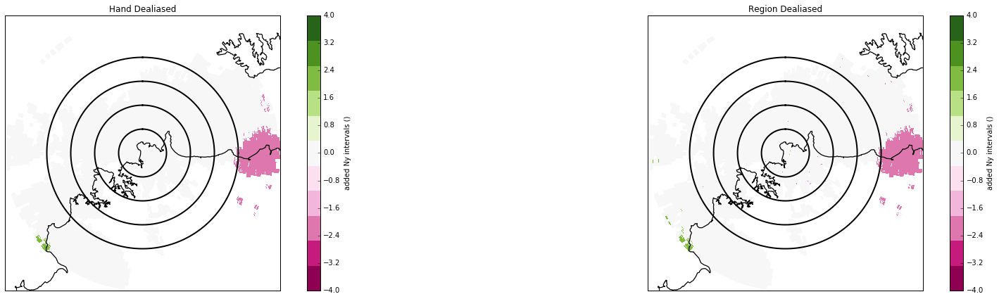

Number of Gates Hand Dealiased
2017
Number of Gates Region Dealiased
1997


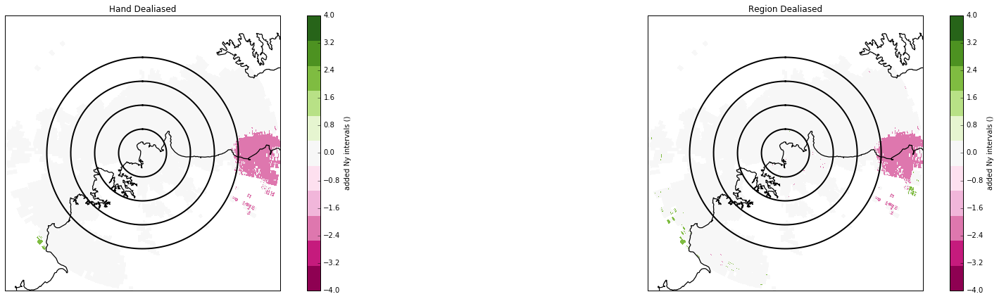

Number of Gates Hand Dealiased
1774
Number of Gates Region Dealiased
1791


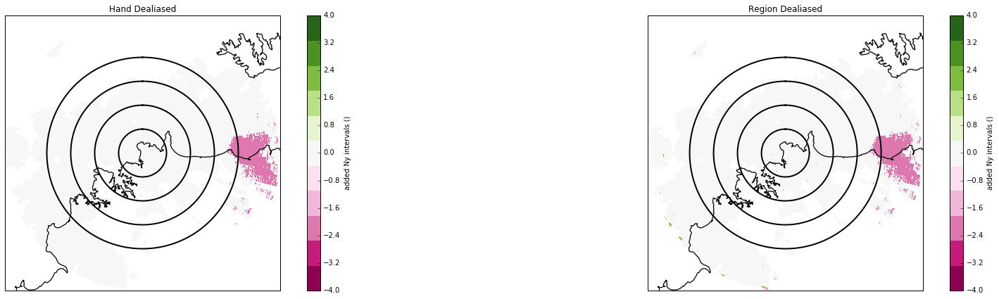

Number of Gates Hand Dealiased
1222
Number of Gates Region Dealiased
1224


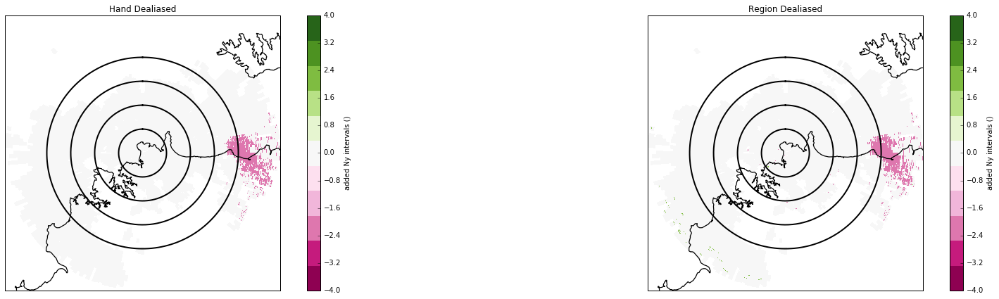

Number of Gates Hand Dealiased
604
Number of Gates Region Dealiased
591


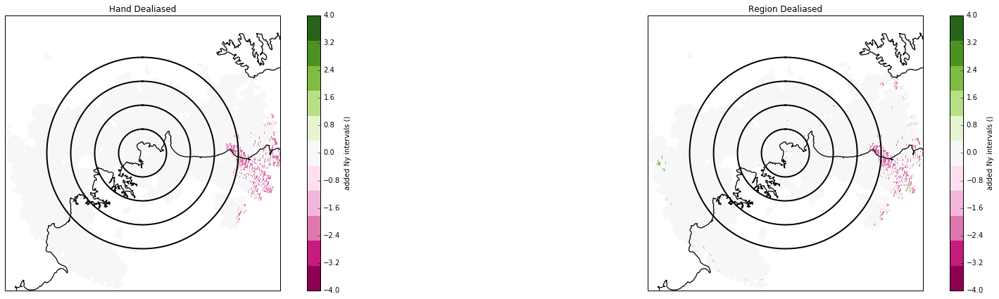

Number of Gates Hand Dealiased
294
Number of Gates Region Dealiased
393


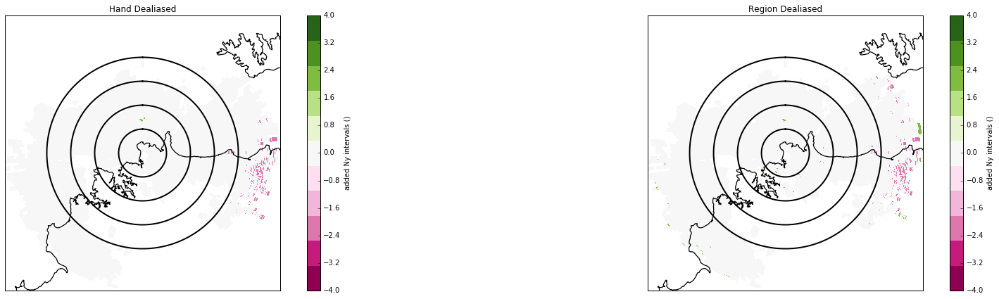

Number of Gates Hand Dealiased
311
Number of Gates Region Dealiased
570


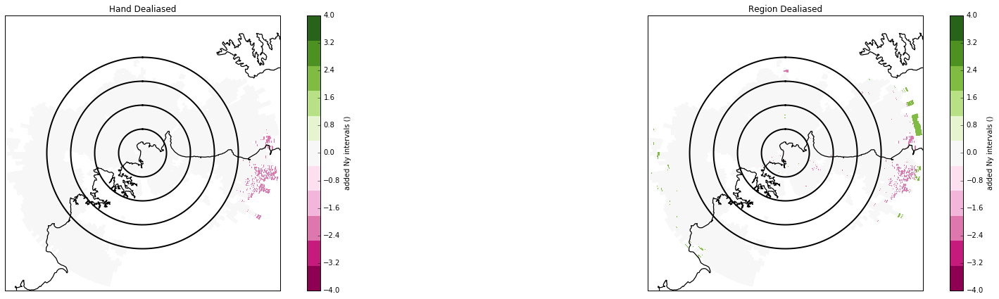

Number of Gates Hand Dealiased
463
Number of Gates Region Dealiased
542


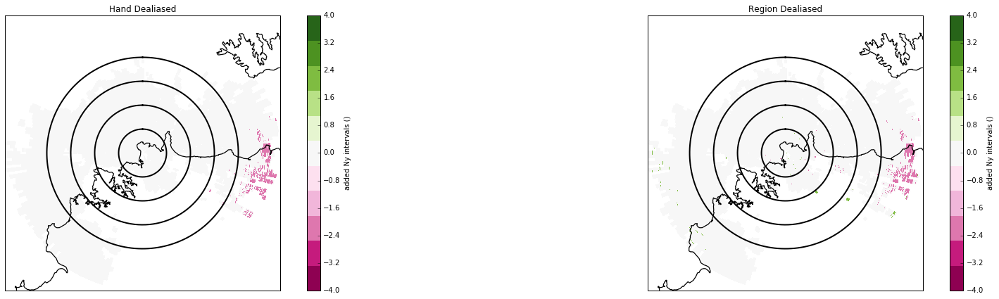

Number of Gates Hand Dealiased
905
Number of Gates Region Dealiased
960


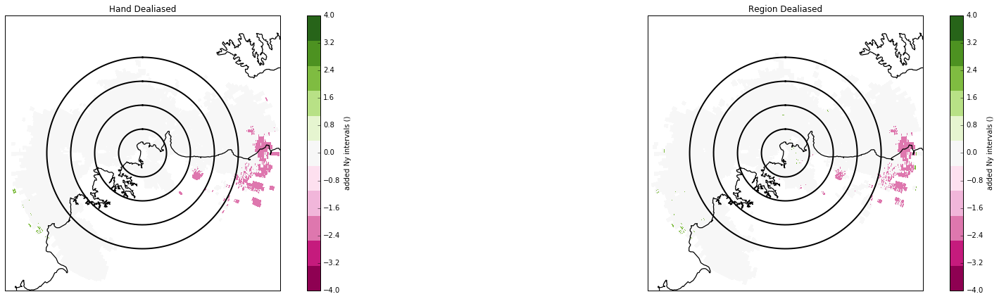

Number of Gates Hand Dealiased
1431
Number of Gates Region Dealiased
1491


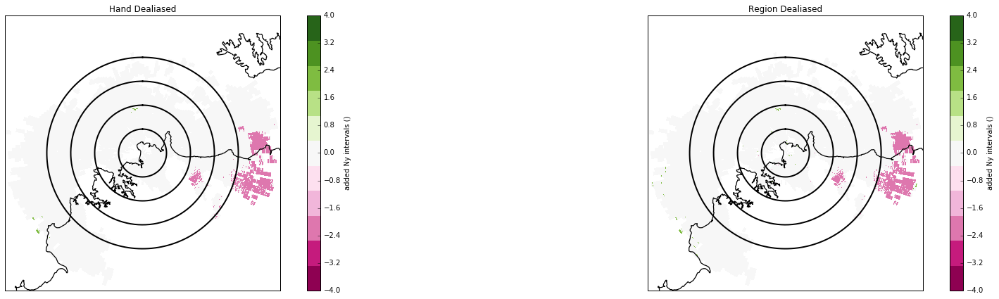

Number of Gates Hand Dealiased
2193
Number of Gates Region Dealiased
2546


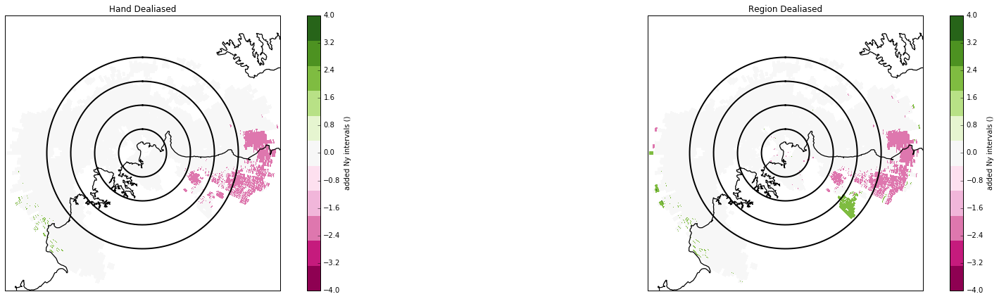

Number of Gates Hand Dealiased
4261
Number of Gates Region Dealiased
4262


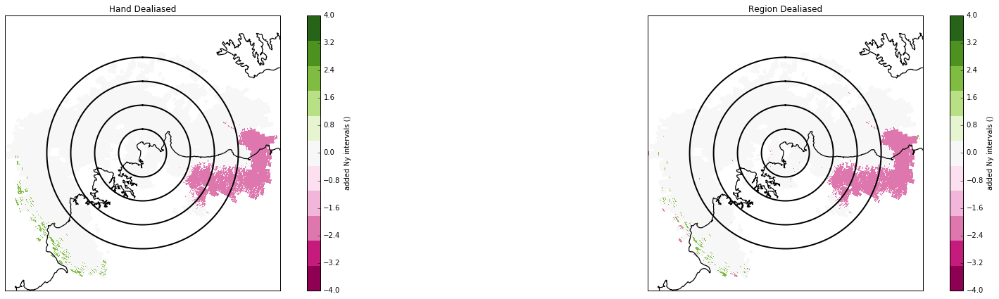

Number of Gates Hand Dealiased
5186
Number of Gates Region Dealiased
23697


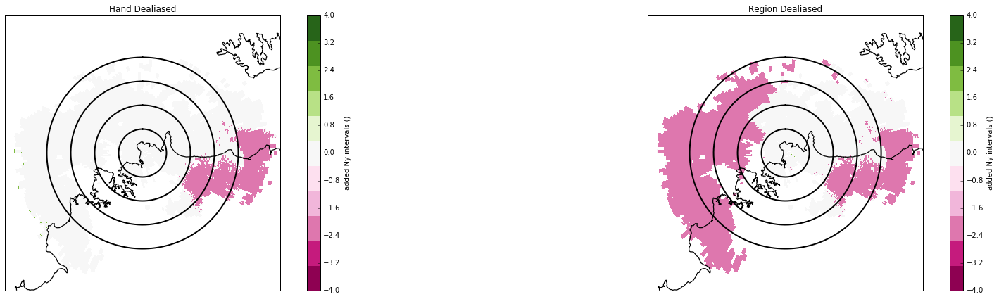

Number of Gates Hand Dealiased
5747
Number of Gates Region Dealiased
11557


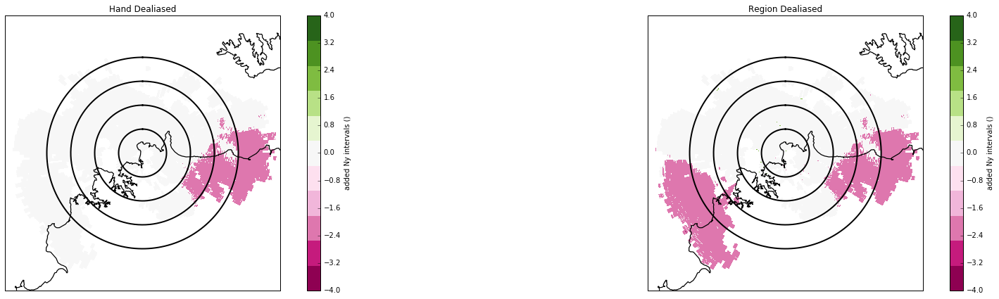

Number of Gates Hand Dealiased
5876
Number of Gates Region Dealiased
25909


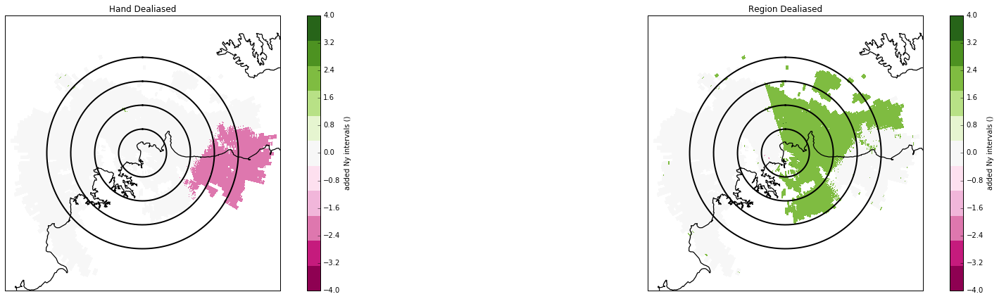

Number of Gates Hand Dealiased
6170
Number of Gates Region Dealiased
26997


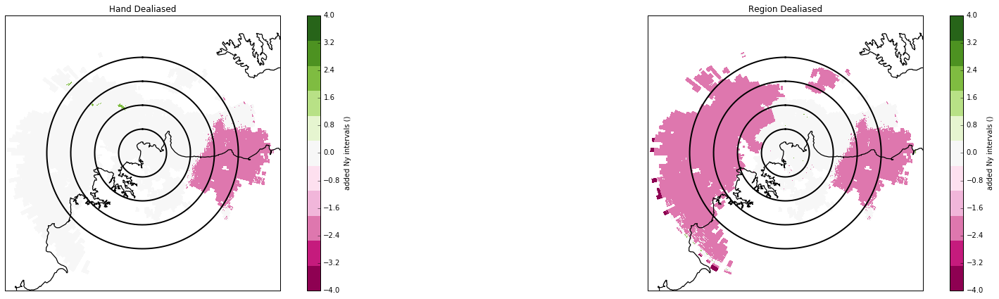

Number of Gates Hand Dealiased
5737
Number of Gates Region Dealiased
9899


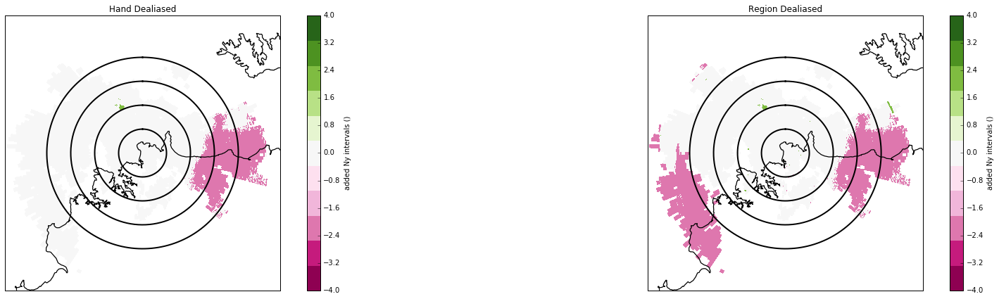

Number of Gates Hand Dealiased
4829
Number of Gates Region Dealiased
5108


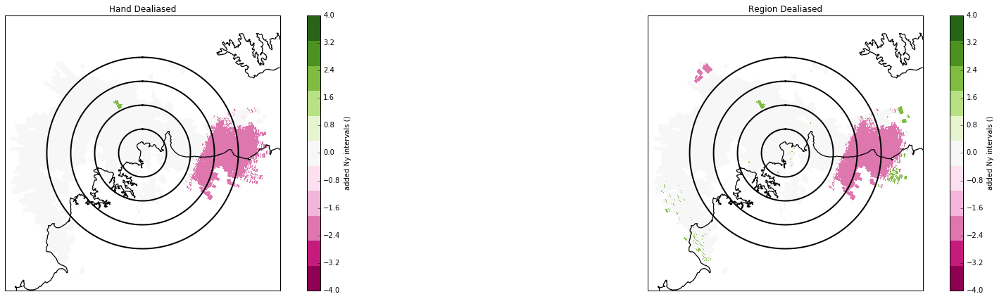

Number of Gates Hand Dealiased
4888
Number of Gates Region Dealiased
4938


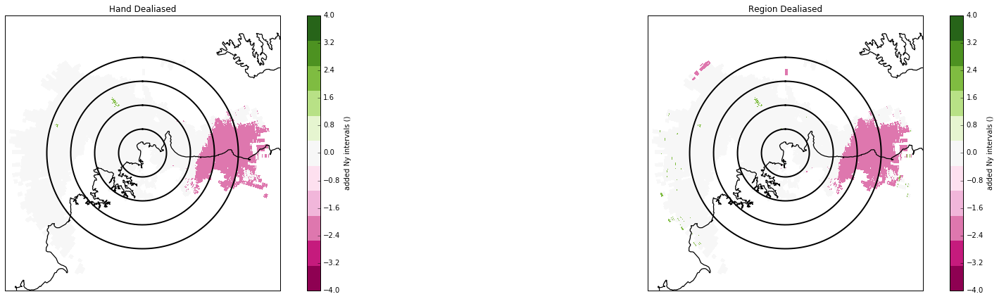

Number of Gates Hand Dealiased
4512
Number of Gates Region Dealiased
4541


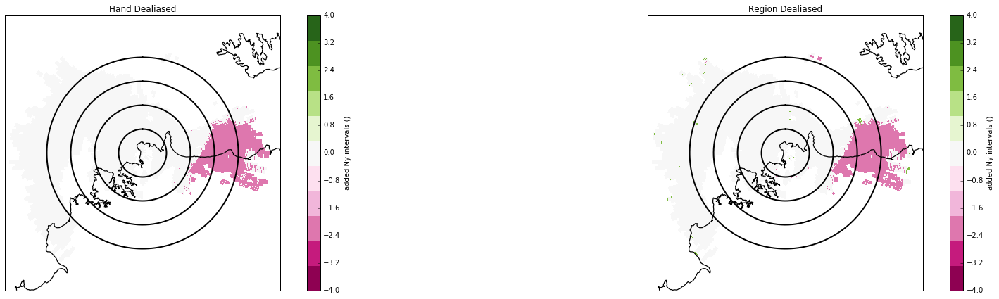

Number of Gates Hand Dealiased
4137
Number of Gates Region Dealiased
17978


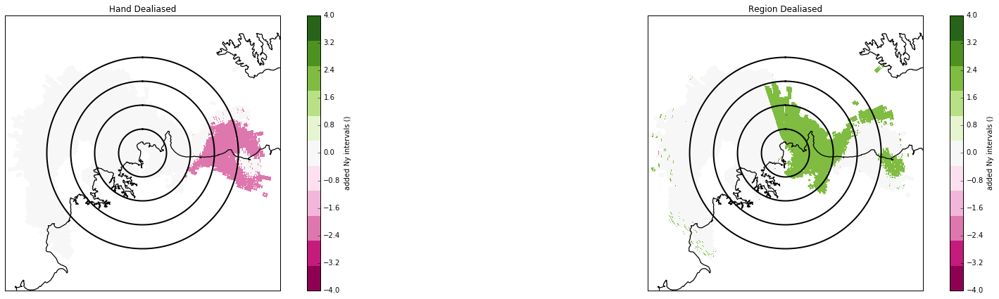

Number of Gates Hand Dealiased
4400
Number of Gates Region Dealiased
4290


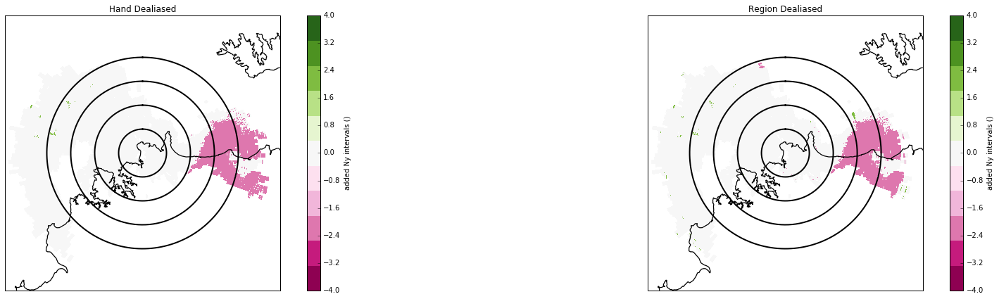

Number of Gates Hand Dealiased
4675
Number of Gates Region Dealiased
16356


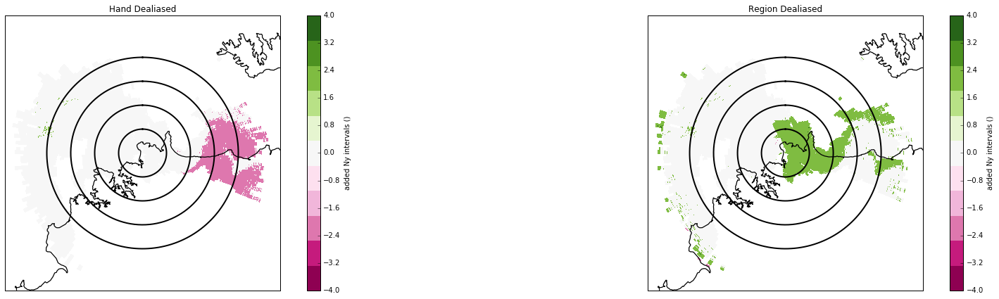

Number of Gates Hand Dealiased
5293
Number of Gates Region Dealiased
4527


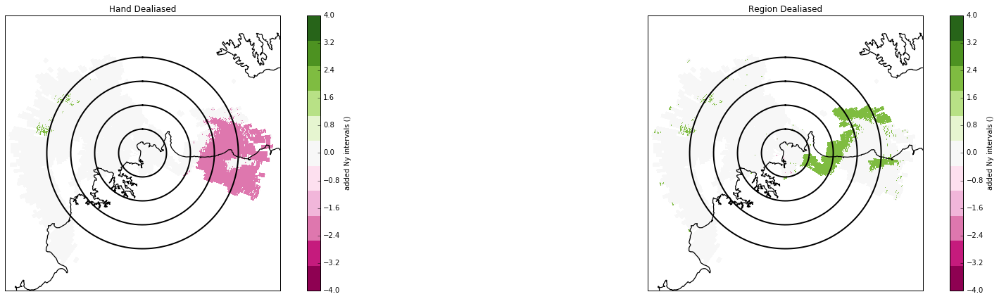

Number of Gates Hand Dealiased
5584
Number of Gates Region Dealiased
4224


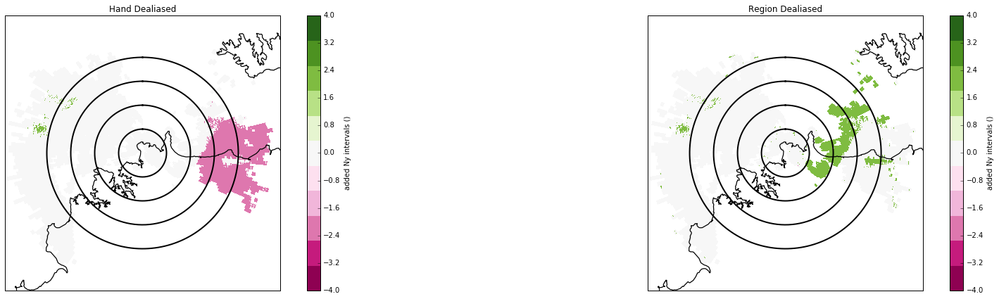

Number of Gates Hand Dealiased
5966
Number of Gates Region Dealiased
9354


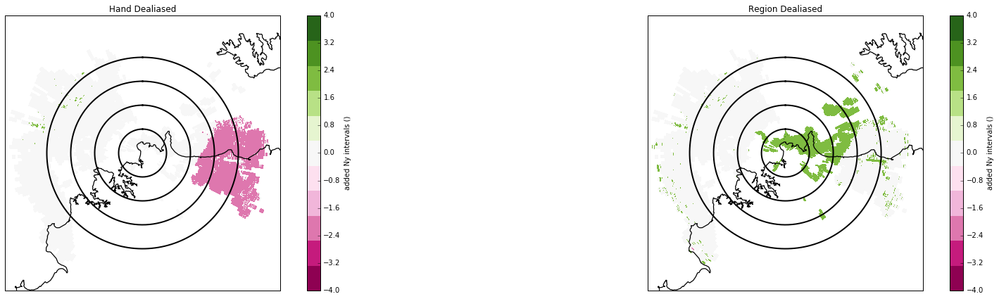

Number of Gates Hand Dealiased
6658
Number of Gates Region Dealiased
8402


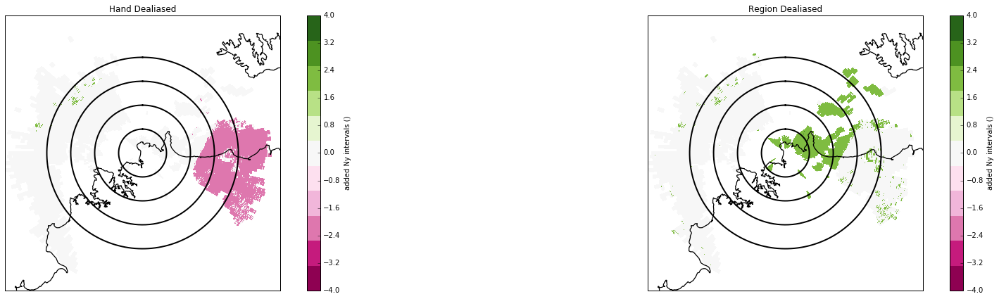

Number of Gates Hand Dealiased
6865
Number of Gates Region Dealiased
7678


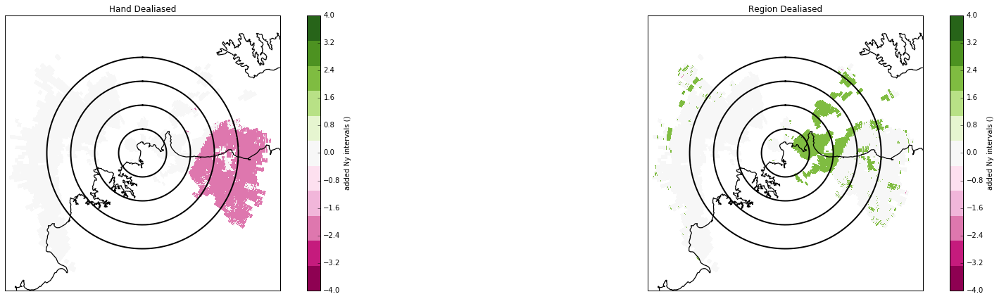

Number of Gates Hand Dealiased
6959
Number of Gates Region Dealiased
10098


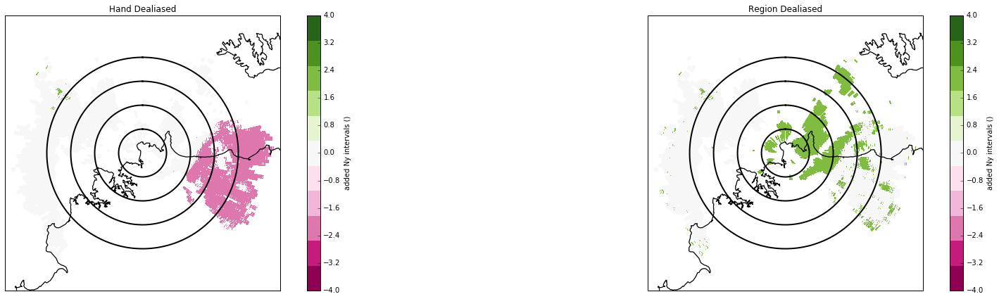

Number of Gates Hand Dealiased
6726
Number of Gates Region Dealiased
10612


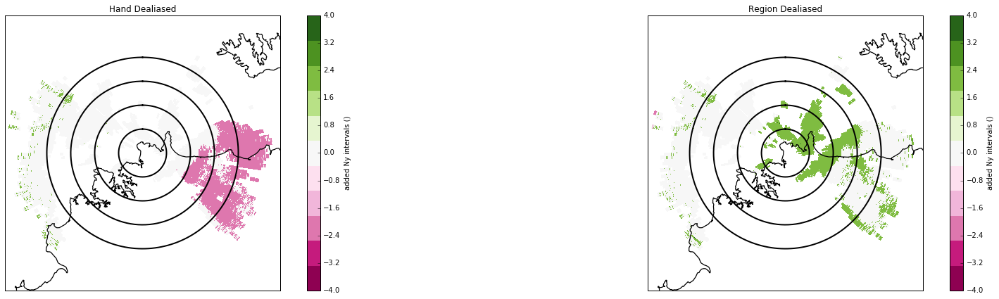

Number of Gates Hand Dealiased
6360
Number of Gates Region Dealiased
7051


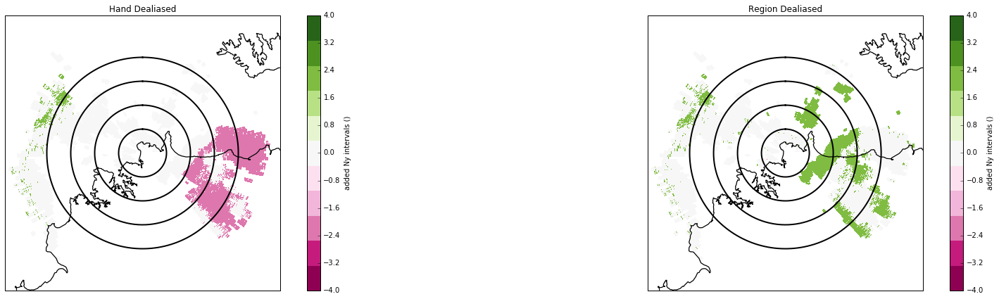

Number of Gates Hand Dealiased
6380
Number of Gates Region Dealiased
6861


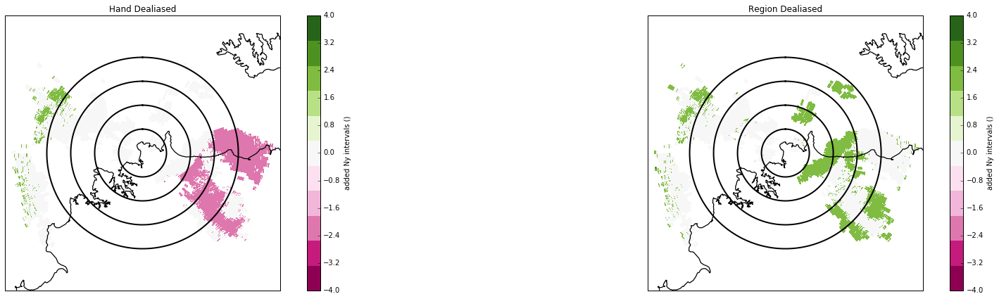

Number of Gates Hand Dealiased
6250
Number of Gates Region Dealiased
6394


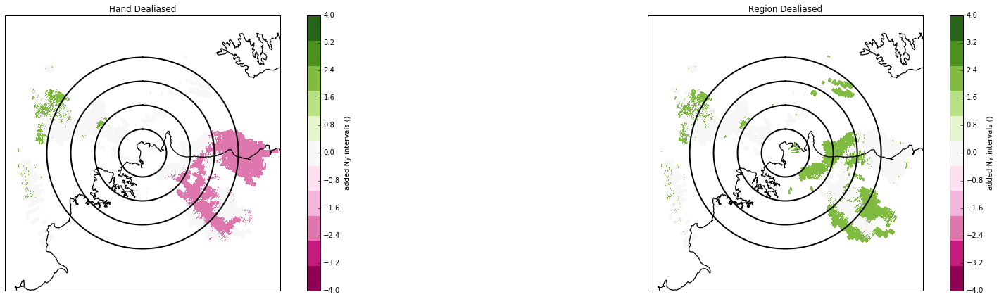

Number of Gates Hand Dealiased
5726
Number of Gates Region Dealiased
6094


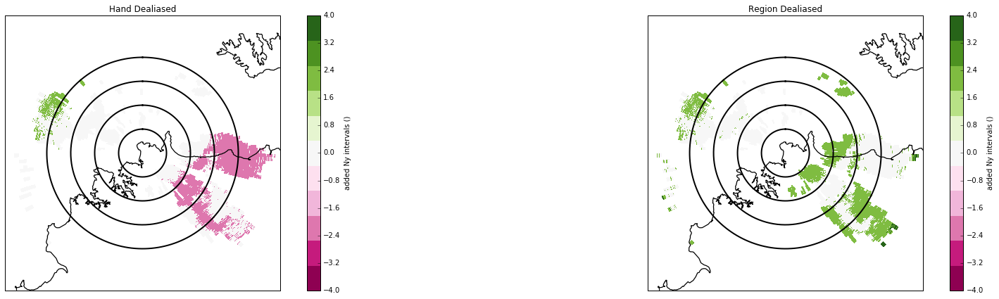

In [28]:
#Plotting region-dealiased radar difference
#Saving radar images in order to later convert into gifs
radar_files = []
for filename in filenames:
    radar_file = pyart.io.read(filename)
    radar_files += [radar_file]
    time(radar_file)
    corrected_velocity_added(radar_file)
    ny_vel = radar_file.instrument_parameters['nyquist_velocity']['data'][0]
    dealiasing_differences_func_region(radar_file, ny_vel)
    #Putting each radar_file through the dealiasing difference function.
    dealiasing_differences_func_hand(radar_file, ny_vel)
    print(n_gates_hand(radar_file))
    print(n_gates_region(radar_file))
    out_path_1 = '/home/zsherman/Documents/Jupyter/CSU_unfolded/Images/Comparison_Added_Nyquist/'
   
    d_cmap = cm.get_cmap('PiYG', 11)
    sw_sel = 0
    sw_num = radar_file.nsweeps
    sw_elevs = [radar_file.fixed_angle['data'][sw] for sw in range(0, sw_num-1)]
    el_sel = sw_elevs[sw_sel]
    

    display = pyart.graph.RadarMapDisplay(radar_file)
    fig = plt.figure(figsize=(30,7), dpi=80, facecolor='w', edgecolor='k')
    ax = fig.add_subplot(122)
    display.plot_ppi_map('dealiasing_differences_sc_region', sweep= 3, vmin=-4, vmax=4, ax=ax, title='Region Dealiased', mask_outside=False, cmap=d_cmap)
    display.plot_range_rings(range(25, 125, 25))
    display.plot_cross_hair(0.5)
    
    display = pyart.graph.RadarMapDisplay(radar_file)
    ax = fig.add_subplot(121)
    display.plot_ppi_map('dealiasing_differences_sc_hand', sweep= 3, vmin=-4, vmax=4, ax=ax, title='Hand Dealiased', mask_outside=False, cmap=d_cmap)
    display.plot_range_rings(range(25, 125, 25))
    display.plot_cross_hair(0.5)
    out_file_1 = out_path_1 + os.path.basename(filename).split('.', 1)[0]+ '_el%.0f' % (el_sel) + '_comparison_added_nyquist.png'
    plt.savefig(out_file_1,  bbox_inches='tight')
    plt.show()

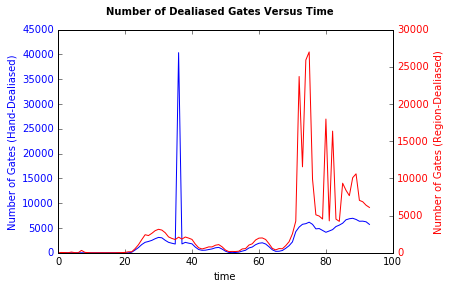

In [29]:
dealias_regions = []
n_gates_regions = []
dealias_hands = []
n_gates_hands = []
times = []
for radar_file in radar_files:
    dealias_hand = ma.asanyarray(radar_file.fields['dealiasing_differences_sc_hand']['data'][radar_file.get_slice(3)])
    dealias_hands += [dealias_hand]
    n_gates_hand = (np.count_nonzero(dealias_hand != 0))
    dealias_region = ma.asanyarray(radar_file.fields['dealiasing_differences_sc_region']['data'][radar_file.get_slice(3)])
    dealias_regions += [dealias_region]
    n_gates_region = (np.count_nonzero(dealias_region != 0))
    n_gates_regions +=[n_gates_region]
    n_gates_hands +=[n_gates_hand]
    time = np.array(radar_file.time)
    times += [time]
    dealias_hands += [dealias_hand]
fig, ax1 = plt.subplots()
fig.suptitle('Number of Dealiased Gates Versus Time', fontsize=10, fontweight='bold')
y1 = n_gates_hands
ax1.plot(y1, 'b-')
ax1.set_xlabel('time')
#ax1.set_xlabel(radar_file.time['standard_name'] + ' (' + radar_file.time['units'] + ')')
# Make the y-axis label and tick labels match the line color.
ax1.set_ylabel('Number of Gates (Hand-Dealiased)', color='b')
for tl in ax1.get_yticklabels():
    tl.set_color('b')
plt.ylim()
x = times
plt.xlim()
ax2 = ax1.twinx()
y2 = n_gates_regions
ax2.plot(y2, 'r-')
ax2.set_ylabel('Number of Gates (Region-Dealiased)', color='r')
for tl in ax2.get_yticklabels():
    tl.set_color('r')
plt.ylim()
plt.show()

#Plot gates and time
